In [ ]:
#1
import os
import random
import collections
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms.v2 as v2
import torchvision.transforms.functional as F
from torchvision.tv_tensors import Image, Mask
from tqdm import tqdm

In [ ]:
#2
import kagglehub

# Download latest version
path = kagglehub.dataset_download("sadhliroomyprime/football-semantic-segmentation")

print("Path to dataset files:", path)

100%|██████████| 68.7M/68.7M [00:00<00:00, 130MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/sadhliroomyprime/football-semantic-segmentation/versions/1


In [ ]:
#3
image_folder = os.path.join(path, "images")
file_list = os.listdir(image_folder)

print(f"file_list: {len(file_list)}")
print(file_list)

file_list: 300
['Frame 1  (2).jpg___fuse.png', 'Frame 1  (79).jpg___save.png', 'Frame 1  (61).jpg', 'Frame 1  (88).jpg___fuse.png', 'Frame 1  (51).jpg', 'Frame 1  (89).jpg___fuse.png', 'Frame 1  (80).jpg___fuse.png', 'Frame 1  (2).jpg', 'Frame 1  (48).jpg___fuse.png', 'Frame 1  (3).jpg___save.png', 'Frame 1  (73).jpg___fuse.png', 'Frame 1  (97).jpg___save.png', 'Frame 1  (57).jpg___fuse.png', 'Frame 1  (87).jpg___save.png', 'Frame 1  (30).jpg___fuse.png', 'Frame 1  (19).jpg', 'Frame 1  (5).jpg___save.png', 'Frame 1  (66).jpg', 'Frame 1  (52).jpg___fuse.png', 'Frame 1  (26).jpg', 'Frame 1  (96).jpg___save.png', 'Frame 1  (33).jpg', 'Frame 1  (15).jpg___save.png', 'Frame 1  (71).jpg___save.png', 'Frame 1  (54).jpg___fuse.png', 'Frame 1  (12).jpg___save.png', 'Frame 1  (99).jpg___fuse.png', 'Frame 1  (42).jpg', 'Frame 1  (16).jpg___fuse.png', 'Frame 1  (60).jpg___save.png', 'Frame 1  (94).jpg', 'Frame 1  (79).jpg___fuse.png', 'Frame 1  (42).jpg___save.png', 'Frame 1  (74).jpg___save.png',

In [ ]:
#4
original_images = sorted([f for f in file_list if f.endswith(".jpg")])
fuse_images = sorted([f for f in file_list if "fuse" in f])
save_images = sorted([f for f in file_list if "save" in f])

print(original_images)
print(fuse_images)
print(save_images)

['Frame 1  (1).jpg', 'Frame 1  (10).jpg', 'Frame 1  (100).jpg', 'Frame 1  (11).jpg', 'Frame 1  (12).jpg', 'Frame 1  (13).jpg', 'Frame 1  (14).jpg', 'Frame 1  (15).jpg', 'Frame 1  (16).jpg', 'Frame 1  (17).jpg', 'Frame 1  (18).jpg', 'Frame 1  (19).jpg', 'Frame 1  (2).jpg', 'Frame 1  (20).jpg', 'Frame 1  (21).jpg', 'Frame 1  (22).jpg', 'Frame 1  (23).jpg', 'Frame 1  (24).jpg', 'Frame 1  (25).jpg', 'Frame 1  (26).jpg', 'Frame 1  (27).jpg', 'Frame 1  (28).jpg', 'Frame 1  (29).jpg', 'Frame 1  (3).jpg', 'Frame 1  (30).jpg', 'Frame 1  (31).jpg', 'Frame 1  (32).jpg', 'Frame 1  (33).jpg', 'Frame 1  (34).jpg', 'Frame 1  (35).jpg', 'Frame 1  (36).jpg', 'Frame 1  (37).jpg', 'Frame 1  (38).jpg', 'Frame 1  (39).jpg', 'Frame 1  (4).jpg', 'Frame 1  (40).jpg', 'Frame 1  (41).jpg', 'Frame 1  (42).jpg', 'Frame 1  (43).jpg', 'Frame 1  (44).jpg', 'Frame 1  (45).jpg', 'Frame 1  (46).jpg', 'Frame 1  (47).jpg', 'Frame 1  (48).jpg', 'Frame 1  (49).jpg', 'Frame 1  (5).jpg', 'Frame 1  (50).jpg', 'Frame 1  (51).j

In [ ]:
#5
def unique_sizes(image_files, image_folder):
    unique_sizes = set()

    for image in image_files:
        img_path = os.path.join(image_folder, image)
        img = cv2.imread(img_path)


        height, width, channels = img.shape
        img_size = (height, width, channels)


        if img_size in unique_sizes:
            continue


        print(f"Image Size (H, W, C): {height}, {width}, {channels}")
        unique_sizes.add(img_size)

print("Unique sizes of Original Image")
unique_sizes(original_images, image_folder)
print("Unique sizes of Fuse Image")
unique_sizes(fuse_images, image_folder)
print("Unique sizes of Save Image")
unique_sizes(save_images, image_folder)

Unique sizes of Original Image
Image Size (H, W, C): 1080, 1920, 3
Unique sizes of Fuse Image
Image Size (H, W, C): 1080, 1920, 3
Unique sizes of Save Image
Image Size (H, W, C): 1080, 1920, 3


In [ ]:
#6
image_pairs = []
for original_image in original_images:
    base_name = original_image.replace(".jpg", "")
    fuse_image = next((f for f in fuse_images if base_name in f), None)
    save_image = next((f for f in save_images if base_name in f), None)

    if fuse_image and save_image:
        original_path = os.path.join(image_folder, original_image)
        fuse_path = os.path.join(image_folder, fuse_image)
        save_path = os.path.join(image_folder, save_image)

        orig = cv2.imread(original_path)
        fuse = cv2.imread(fuse_path)
        save = cv2.imread(save_path)

        if orig is not None and fuse is not None and save is not None:
            image_pairs.append((orig, fuse, save))


print(f"{len(image_pairs)} pairs")

100 pairs


5 samples


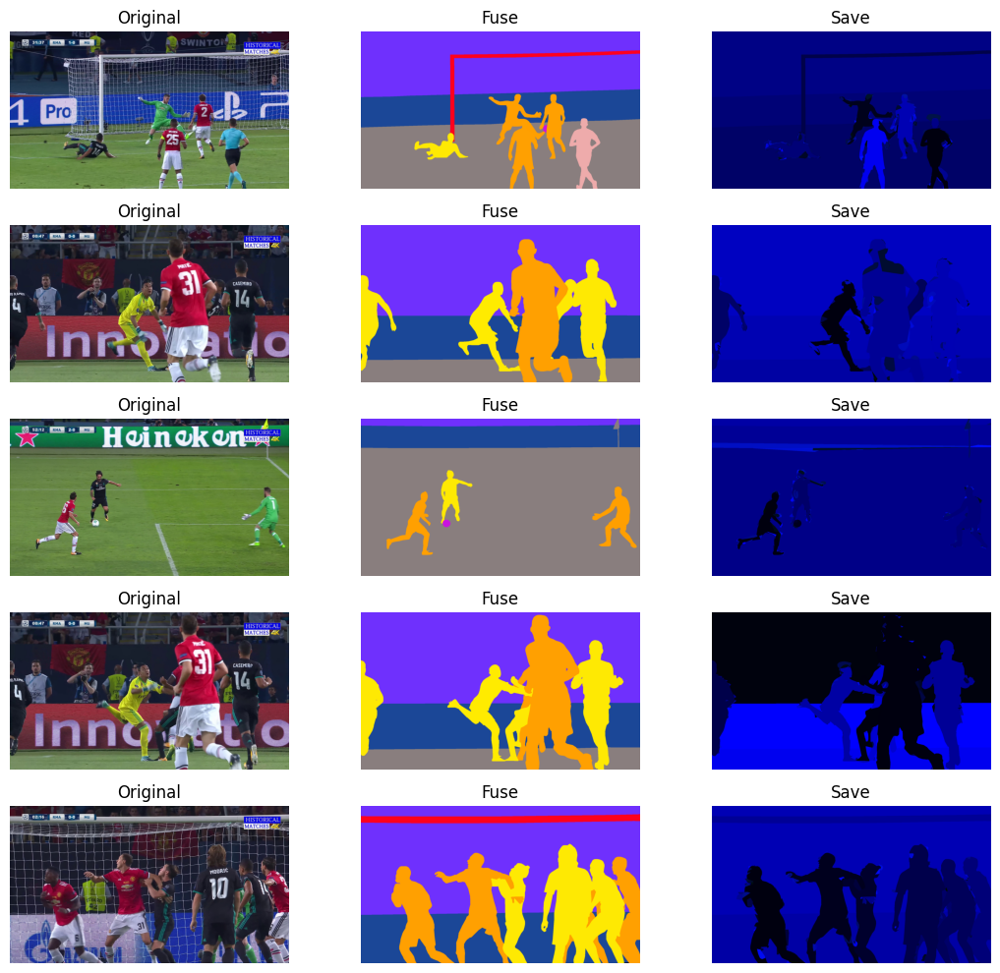

In [ ]:
#7
num_samples = 5
sample_image_pairs = random.sample(image_pairs, num_samples)


print(f"{len(sample_image_pairs)} samples")


fig, axes, = plt.subplots(num_samples, 3, figsize=(11, 10))

for i, (orig, fuse, save) in enumerate(sample_image_pairs):

    axes[i, 0].imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title("Original")
    axes[i, 0].axis("off")

    # fuse
    axes[i, 1].imshow(cv2.cvtColor(fuse, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title("Fuse")
    axes[i, 1].axis("off")

    # save
    axes[i, 2].imshow(cv2.cvtColor(save, cv2.COLOR_BGR2RGB))
    axes[i, 2].set_title("Save")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
#8
def get_unique_colors(image_folder, mask_files, max_classes=11):

    color_set = set()

    for mask_file in mask_files:
        mask_path = os.path.join(image_folder, mask_file)
        mask = cv2.imread(mask_path, cv2.IMREAD_COLOR)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        unique_colors, _ = np.unique(mask.reshape(-1, 3), axis=0, return_counts=True)

        for color in unique_colors:
            if tuple(color) not in color_set:
                color_set.add(tuple(color))


                if len(color_set) >= max_classes:
                    return list(color_set)

    return list(color_set)


unique_colors = get_unique_colors(image_folder, fuse_images)
print(f"Unique colors: {len(unique_colors)}")

Unique colors: 11


In [ ]:
#9
color_to_label = {color: idx for idx, color in enumerate(unique_colors)}
print(color_to_label)

{(np.uint8(238), np.uint8(171), np.uint8(171)): 0, (np.uint8(254), np.uint8(233), np.uint8(3)): 1, (np.uint8(0), np.uint8(0), np.uint8(0)): 2, (np.uint8(255), np.uint8(0), np.uint8(29)): 3, (np.uint8(111), np.uint8(48), np.uint8(253)): 4, (np.uint8(137), np.uint8(126), np.uint8(126)): 5, (np.uint8(27), np.uint8(71), np.uint8(151)): 6, (np.uint8(255), np.uint8(160), np.uint8(1)): 7, (np.uint8(201), np.uint8(19), np.uint8(223)): 8, (np.uint8(255), np.uint8(159), np.uint8(0)): 9, (np.uint8(255), np.uint8(235), np.uint8(0)): 10}


In [ ]:
#10
class FootballDataset(Dataset):
    def __init__(self, image_files, mask_files, image_folder, color_to_label, transform=None):
        self.image_files = image_files
        self.mask_files = mask_files
        self.image_folder = image_folder
        self.color_to_label = color_to_label
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_folder, self.image_files[idx])
        mask_path = os.path.join(self.image_folder, self.mask_files[idx])


        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


        mask = cv2.imread(mask_path, cv2.IMREAD_COLOR)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)


        if self.transform is None:
            img = cv2.resize(img, (256, 256)) / 255.0
            img = torch.tensor(img, dtype=torch.float32).permute(2, 0, 1)

            mask = cv2.resize(mask, (256, 256), interpolation=cv2.INTER_NEAREST)
            mask = torch.tensor(mask, dtype=torch.uint8).permute(2, 0, 1)
        else:

            img = Image(torch.from_numpy(img).permute(2, 0, 1))
            mask = Mask(torch.from_numpy(mask).permute(2, 0, 1))
            img, mask = self.transform(img, mask)


        mask_np = mask.permute(1, 2, 0).numpy()
        mask_class = np.zeros(mask_np.shape[:2], dtype=np.uint8)
        for color, label in self.color_to_label.items():
            mask_class[np.all(mask_np == np.array(color), axis=-1)] = label


        mask = torch.tensor(mask_class, dtype=torch.long)

        return img, mask

In [ ]:
#11
dataset_size = len(original_images)
trainval_size = int(0.9 * dataset_size)  # 90 Train
test_size = dataset_size - trainval_size  # 10 Test


paired_files = list(zip(original_images, fuse_images))


trainval_files, test_files = random_split(paired_files, [trainval_size, test_size])


val_size = int(1/9 * trainval_size)  # 10 Validation
train_size = trainval_size - val_size  # 80 Train
train_files, val_files = random_split(trainval_files, [train_size, val_size])



train_image_files, train_mask_files = zip(*train_files)
val_image_files, val_mask_files = zip(*val_files)
test_image_files, test_mask_files = zip(*test_files)


print("Checking Train images and masks")
for img, mask in zip(train_image_files, train_mask_files):
    base_img = img.split(".jpg")[0]
    base_mask = mask.split(".jpg___fuse.png")[0]
    if base_img != base_mask:
        print(f"Mismatch: {img} <-> {mask}")

print("Checking Val images and masks")
for img, mask in zip(val_image_files, val_mask_files):
    base_img = img.split(".jpg")[0]
    base_mask = mask.split(".jpg___fuse.png")[0]
    if base_img != base_mask:
        print(f"Mismatch: {img} <-> {mask}")

print("Checking Test images and masks")
for img, mask in zip(test_image_files, test_mask_files):
    base_img = img.split(".jpg")[0]
    base_mask = mask.split(".jpg___fuse.png")[0]
    if base_img != base_mask:
        print(f"Mismatch: {img} <-> {mask}")

Checking Train images and masks
Checking Val images and masks
Checking Test images and masks


In [ ]:
#12
train_dataset = FootballDataset(train_image_files, train_mask_files, image_folder, color_to_label)
val_dataset = FootballDataset(val_image_files, val_mask_files, image_folder, color_to_label)
test_dataset = FootballDataset(test_image_files, test_mask_files, image_folder, color_to_label)


train_loader = DataLoader(train_dataset, batch_size=5, shuffle=True, drop_last=False)
val_loader = DataLoader(val_dataset, batch_size=5, shuffle=False, drop_last=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, drop_last=False)

print(f"Train Data: {len(train_dataset)}, Val Data: {len(val_dataset)}, Test Data: {len(test_dataset)}")

for img, mask in train_loader:
    print(f"image size: {img.shape}")
    print(f"mask size: {mask.shape}")
    break

Train Data: 80, Val Data: 10, Test Data: 10
image size: torch.Size([5, 3, 256, 256])
mask size: torch.Size([5, 256, 256])


In [ ]:
#13
train_transform = v2.Compose([
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.2),
    v2.RandomRotation(degrees=10),
    v2.RandomResizedCrop(size=(256, 256), scale=(0.8, 1.0)),
    v2.ToDtype(torch.float32, scale=True),
])

valtest_transform = v2.Compose([
    v2.Resize((256, 256)),
    v2.ToDtype(torch.float32, scale=True),
])

In [ ]:
#14
train_transformed_dataset = FootballDataset(train_image_files, train_mask_files, image_folder, color_to_label, train_transform)
val_transformedtrain_transformed_dataset = FootballDataset(val_image_files, val_mask_files, image_folder, color_to_label, valtest_transform)
test_transformedtrain_transformed_dataset = FootballDataset(test_image_files, test_mask_files, image_folder, color_to_label, valtest_transform)


train_transformed_loader = DataLoader(train_transformed_dataset, batch_size=5, shuffle=True, drop_last=False)
val_transformed_loader = DataLoader(val_transformedtrain_transformed_dataset, batch_size=5, shuffle=False, drop_last=False)
test_transformed_loader = DataLoader(test_transformedtrain_transformed_dataset, batch_size=1, shuffle=False, drop_last=False)

print(f"Train Data: {len(train_transformed_dataset)}, Val Data: {len(val_transformedtrain_transformed_dataset)}, Test Data: {len(test_transformedtrain_transformed_dataset)}")

for img, mask in train_transformed_loader:
    print(f"image size: {img.shape}")
    print(f"mask size: {mask.shape}")
    break

Train Data: 80, Val Data: 10, Test Data: 10
image size: torch.Size([5, 3, 256, 256])
mask size: torch.Size([5, 256, 256])


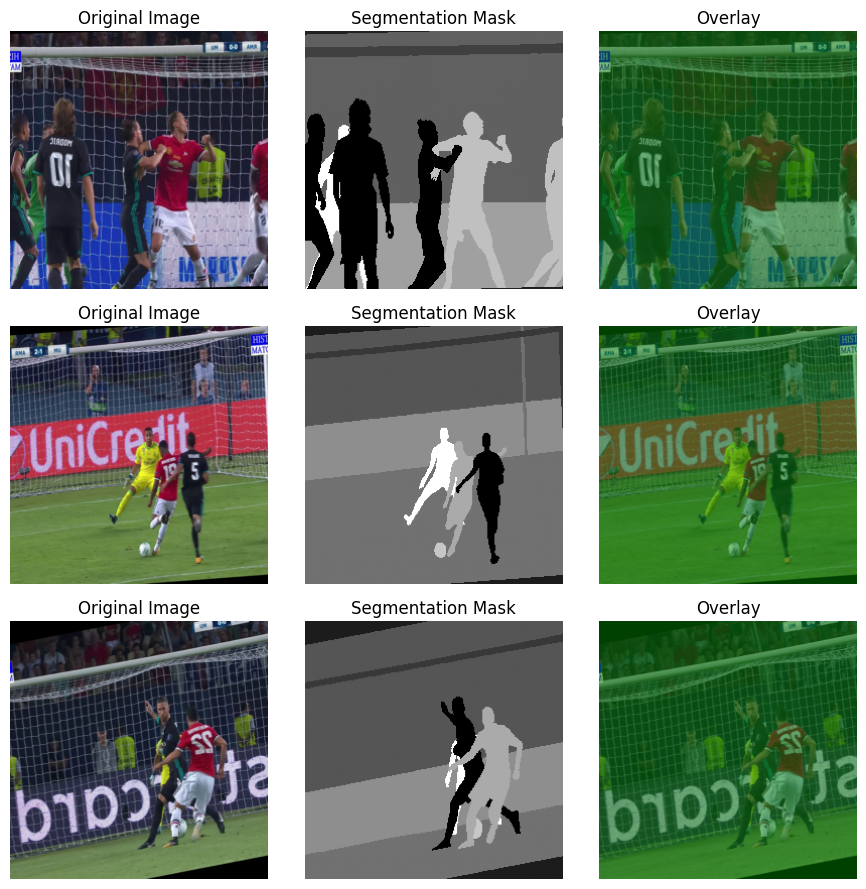

In [ ]:
#15
from torchvision.utils import draw_segmentation_masks
import torchvision.transforms.v2.functional as F
def visualize_samples(loader, num_samples=3):
    data_iter = iter(loader)
    imgs, masks = next(data_iter)

    fig, axs = plt.subplots(num_samples, 3, figsize=(9, num_samples * 3))

    for i in range(num_samples):
        img = imgs[i]
        mask = masks[i]


        img = F.to_dtype(img, torch.uint8, scale=True)


        mask_overlay = draw_segmentation_masks(img, mask.unsqueeze(0).to(torch.bool), colors=["green"], alpha=0.5)


        axs[i, 0].imshow(img.permute(1, 2, 0).numpy())  # (C, H, W) → (H, W, C)
        axs[i, 0].set_title("Original Image")
        axs[i, 0].axis("off")


        axs[i, 1].imshow(mask.numpy(), cmap="gray")
        axs[i, 1].set_title("Segmentation Mask")
        axs[i, 1].axis("off")


        axs[i, 2].imshow(mask_overlay.permute(1, 2, 0).numpy())  # (C, H, W) → (H, W, C)
        axs[i, 2].set_title("Overlay")
        axs[i, 2].axis("off")

    plt.tight_layout()
    plt.show()


visualize_samples(train_transformed_loader)

In [ ]:
#16
for img, mask in train_transformed_loader:
    print(f"Image shape: {img.shape}")
    print(f"Mask shape: {mask.shape}")


    print(f"Image min: {img.min()}, max: {img.max()}")


    print(f"Unique mask values: {torch.unique(mask)}")

    break

Image shape: torch.Size([5, 3, 256, 256])
Mask shape: torch.Size([5, 256, 256])
Image min: 0.0, max: 1.0
Unique mask values: tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])


In [ ]:
#17
if "COLAB_GPU" in os.environ:
    model_dir = "/content/drive/My Drive/model_storage/"
elif os.path.exists("/kaggle"):
    model_dir = "/kaggle/working/model_storage/"
else:
    model_dir = "./model_storage"



os.makedirs(model_dir, exist_ok=True)
print(f"Now using Model Directory: {model_dir}")



def get_model_path(model_name):
    return os.path.join(model_dir, f"{model_name}.pth")



def save_model(model, model_name, optimizer, scheduler, epoch, best_metric):
    model_path = get_model_path(model_name)
    checkpoint = {
        "model": model.state_dict(),
        "optimizer": optimizer.state_dict(),
        "scheduler": scheduler.state_dict(),
        "epoch": epoch + 1,
        "best_metric": best_metric
    }
    torch.save(checkpoint, model_path)
    print(f"Checkpint Saved: {model_path}, Epoch: {epoch + 1}, Best Metric: {best_metric:.4f}")



def load_model(model, model_name, optimizer, scheduler):
    """
    return: model.to(device), epoch, best_metrich
    """
    model_path = get_model_path(model_name)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


    if not os.path.exists(model_path):
        print(f"No Checkpoint Found: {model_path}")
        return model.to(device), 0, float("inf")


    checkpoint = torch.load(model_path, map_location=device, weights_only=True)

    model.load_state_dict(checkpoint["model"])
    epoch = checkpoint["epoch"]
    best_metric = checkpoint["best_metric"]


    if optimizer is not None:
        optimizer.load_state_dict(checkpoint["optimizer"])
    if scheduler is not None:
        scheduler.load_state_dict(checkpoint["scheduler"])

    print(f"Checkpoint Loaded: {model_path}, Epoch: {epoch}, Best Metric: {best_metric:.4f}")
    return model.to(device), epoch, best_metric



device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

Now using Model Directory: /content/drive/My Drive/model_storage/
cpu


In [ ]:
#18
!pip install torchinfo

In [ ]:
#19
from torchinfo import summary

In [ ]:
#20
def train_model(model, model_name, trainloader, valloader, criterion, optimizer, scheduler, num_epochs):
    model.to(device)
    model, start_epoch, best_metric = load_model(model, model_name, optimizer, scheduler)

    print(f"Start with Epoch={start_epoch}, Best Metric={best_metric}")
    for epoch in range(start_epoch, num_epochs):
        model.train()
        train_loss = 0
        avg_train_loss = 0


        train_bar = tqdm(trainloader, desc=f"Training {epoch+1}/{num_epochs}")
        for images, masks in train_bar:
            images, masks = images.to(device), masks.to(device)
            masks = torch.clamp(masks, min=0, max=10)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_bar.set_postfix({"Loss": loss.item()})

        avg_train_loss = train_loss / len(trainloader)
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_train_loss:.4f}")


        model.eval()
        val_loss = 0
        avg_val_loss = 0
        val_bar = tqdm(valloader, desc=f"Validation {epoch+1}/{num_epochs}")

        with torch.no_grad():
            for images, masks in val_bar:
                images, masks = images.to(device), masks.to(device)
                masks = torch.clamp(masks, min=0, max=10)

                outputs = model(images)
                loss = criterion(outputs, masks)

                val_loss += loss.item()
                val_bar.set_postfix({"Loss": loss.item()})

        avg_val_loss = val_loss / len(valloader)
        print(f"Validation Loss: {avg_val_loss:.4f}\n")


        if scheduler is not None:
            current_lr = optimizer.param_groups[0]['lr']

            if isinstance(scheduler, optim.lr_scheduler.ReduceLROnPlateau):
                scheduler.step(avg_val_loss)
            else:
                scheduler.step()
            updated_lr = optimizer.param_groups[0]['lr']
            if updated_lr != current_lr:
                print(f"Learning Rate Updated: {current_lr:6f} -> {updated_lr:6f}")


        if avg_val_loss < best_metric:
            print(f"Best Validation Metric Updated: {best_metric:.4f} -> {avg_val_loss:.4f}")
            best_metric = avg_val_loss
            save_model(model, model_name, optimizer, scheduler, epoch, best_metric)

# LOSS

In [ ]:
#21
class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.ce_loss = nn.CrossEntropyLoss()

    def forward(self, inputs, targets):
        ce_loss = self.ce_loss(inputs, targets)
        pt = torch.exp(-ce_loss)
        focal_loss = self.alpha * (1 - pt) ** self.gamma * ce_loss
        return focal_loss.mean()


class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6, num_classes=11):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
        self.num_classes = num_classes

    def forward(self, inputs, targets):

        inputs = torch.softmax(inputs, dim=1)


        targets = torch.nn.functional.one_hot(targets, num_classes=self.num_classes).permute(0, 3, 1, 2).float()


        intersection = (inputs * targets).sum(dim=(2, 3))
        dice_score = (2. * intersection + self.smooth) / (inputs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3)) + self.smooth)
        return 1 - dice_score.mean()


class HybridLoss(nn.Module):
    def __init__(self, alpha=0.5, num_classes=11):
        super(HybridLoss, self).__init__()
        self.focal = FocalLoss()
        self.dice = DiceLoss(num_classes=num_classes)
        self.alpha = alpha

    def forward(self, inputs, targets):
        return self.alpha * self.focal(inputs, targets) + (1 - self.alpha) * self.dice(inputs, targets)

## Baseline-unet

In [ ]:
#22
class UNet(nn.Module):
    def __init__(self, num_classes=11):
        super(UNet, self).__init__()

        def conv_block(in_channels, out_channels):
            return nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
            )

        self.encoder1 = conv_block(3, 64)
        self.encoder2 = conv_block(64, 128)
        self.encoder3 = conv_block(128, 256)
        self.encoder4 = conv_block(256, 512)

        self.pool = nn.MaxPool2d(2, 2)

        self.bottleneck = conv_block(512, 1024)

        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.decoder4 = conv_block(1024, 512)

        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.decoder3 = conv_block(512, 256)

        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.decoder2 = conv_block(256, 128)

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.decoder1 = conv_block(128, 64)

        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x):

        e1 = self.encoder1(x)               # (batch, 64, H, W)
        e2 = self.encoder2(self.pool(e1))   # (batch, 128, H/2, W/2)
        e3 = self.encoder3(self.pool(e2))   # (batch, 256, H/4, W/4)
        e4 = self.encoder4(self.pool(e3))   # (batch, 512, H/8, W/8)


        b = self.bottleneck(self.pool(e4))  # (batch, 1024, H/16, W/16)


        d4 = self.upconv4(b)                # (batch, 512, H/8, W/8)
        d4 = torch.cat((d4, e4), dim=1)     # (batch, 1024, H/8, W/8)
        d4 = self.decoder4(d4)              # (batch, 512, H/8, W/8)

        d3 = self.upconv3(d4)               # (batch, 256, H/4, W/4)
        d3 = torch.cat((d3, e3), dim=1)     # (batch, 512, H/4, W/4)
        d3 = self.decoder3(d3)              # (batch, 256, H/4, W/4)

        d2 = self.upconv2(d3)               # (batch, 128, H/2, W/2)
        d2 = torch.cat((d2, e2), dim=1)     # (batch, 256, H/2, W/2)
        d2 = self.decoder2(d2)              # (batch, 128, H/2, W/2)

        d1 = self.upconv1(d2)               # (batch, 64, H, W)
        d1 = torch.cat((d1, e1), dim=1)     # (batch, 128, H, W)
        d1 = self.decoder1(d1)              # (batch, 64, H, W)

        return self.final_conv(d1)          # (batch, num_classes, H, W)

In [ ]:
#23
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet(num_classes=11).to(device)

num_epochs = 35
criterion = HybridLoss(alpha=0.5, num_classes=11)
optimizer = optim.Adam(model.parameters(), lr=0.005, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)

train_model(model, "Baseline_UNet", train_loader, val_loader, criterion, optimizer, scheduler, num_epochs)

No Checkpoint Found: /content/drive/My Drive/model_storage/Baseline_UNet.pth
Start with Epoch=0, Best Metric=inf


Training 1/35: 100%|██████████| 16/16 [08:34<00:00, 32.13s/it, Loss=0.438]


Epoch [1/35], Loss: 0.4974


Validation 1/35: 100%|██████████| 2/2 [00:17<00:00,  8.87s/it, Loss=0.467]


Validation Loss: 0.4583

Learning Rate Updated: 0.005000 -> 0.004990
Best Validation Metric Updated: inf -> 0.4583
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 1, Best Metric: 0.4583


Training 2/35: 100%|██████████| 16/16 [08:30<00:00, 31.92s/it, Loss=0.417]


Epoch [2/35], Loss: 0.4227


Validation 2/35: 100%|██████████| 2/2 [00:19<00:00,  9.64s/it, Loss=0.436]


Validation Loss: 0.4148

Learning Rate Updated: 0.004990 -> 0.004960
Best Validation Metric Updated: 0.4583 -> 0.4148
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 2, Best Metric: 0.4148


Training 3/35: 100%|██████████| 16/16 [08:15<00:00, 30.97s/it, Loss=0.397]


Epoch [3/35], Loss: 0.4059


Validation 3/35: 100%|██████████| 2/2 [00:16<00:00,  8.38s/it, Loss=0.473]


Validation Loss: 0.4635

Learning Rate Updated: 0.004960 -> 0.004910


Training 4/35: 100%|██████████| 16/16 [08:09<00:00, 30.57s/it, Loss=0.354]


Epoch [4/35], Loss: 0.3819


Validation 4/35: 100%|██████████| 2/2 [00:18<00:00,  9.48s/it, Loss=0.376]


Validation Loss: 0.3620

Learning Rate Updated: 0.004910 -> 0.004841
Best Validation Metric Updated: 0.4148 -> 0.3620
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 4, Best Metric: 0.3620


Training 5/35: 100%|██████████| 16/16 [08:04<00:00, 30.25s/it, Loss=0.359]


Epoch [5/35], Loss: 0.3605


Validation 5/35: 100%|██████████| 2/2 [00:17<00:00,  8.71s/it, Loss=0.412]


Validation Loss: 0.3898

Learning Rate Updated: 0.004841 -> 0.004752


Training 6/35: 100%|██████████| 16/16 [08:10<00:00, 30.68s/it, Loss=0.326]


Epoch [6/35], Loss: 0.3421


Validation 6/35: 100%|██████████| 2/2 [00:18<00:00,  9.34s/it, Loss=0.389]


Validation Loss: 0.3735

Learning Rate Updated: 0.004752 -> 0.004646


Training 7/35: 100%|██████████| 16/16 [08:15<00:00, 30.99s/it, Loss=0.318]


Epoch [7/35], Loss: 0.3368


Validation 7/35: 100%|██████████| 2/2 [00:19<00:00,  9.94s/it, Loss=0.362]


Validation Loss: 0.3463

Learning Rate Updated: 0.004646 -> 0.004523
Best Validation Metric Updated: 0.3620 -> 0.3463
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 7, Best Metric: 0.3463


Training 8/35: 100%|██████████| 16/16 [08:30<00:00, 31.92s/it, Loss=0.347]


Epoch [8/35], Loss: 0.3225


Validation 8/35: 100%|██████████| 2/2 [00:17<00:00,  8.97s/it, Loss=0.366]


Validation Loss: 0.3383

Learning Rate Updated: 0.004523 -> 0.004383
Best Validation Metric Updated: 0.3463 -> 0.3383
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 8, Best Metric: 0.3383


Training 9/35: 100%|██████████| 16/16 [08:22<00:00, 31.40s/it, Loss=0.311]


Epoch [9/35], Loss: 0.3154


Validation 9/35: 100%|██████████| 2/2 [00:17<00:00,  8.77s/it, Loss=0.358]


Validation Loss: 0.3349

Learning Rate Updated: 0.004383 -> 0.004228
Best Validation Metric Updated: 0.3383 -> 0.3349
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 9, Best Metric: 0.3349


Training 10/35: 100%|██████████| 16/16 [08:12<00:00, 30.75s/it, Loss=0.33]


Epoch [10/35], Loss: 0.3087


Validation 10/35: 100%|██████████| 2/2 [00:17<00:00,  8.64s/it, Loss=0.336]


Validation Loss: 0.3148

Learning Rate Updated: 0.004228 -> 0.004059
Best Validation Metric Updated: 0.3349 -> 0.3148
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 10, Best Metric: 0.3148


Training 11/35: 100%|██████████| 16/16 [08:18<00:00, 31.16s/it, Loss=0.288]


Epoch [11/35], Loss: 0.3014


Validation 11/35: 100%|██████████| 2/2 [00:18<00:00,  9.47s/it, Loss=0.338]


Validation Loss: 0.3200

Learning Rate Updated: 0.004059 -> 0.003877


Training 12/35: 100%|██████████| 16/16 [08:18<00:00, 31.17s/it, Loss=0.277]


Epoch [12/35], Loss: 0.2973


Validation 12/35: 100%|██████████| 2/2 [00:17<00:00,  8.82s/it, Loss=0.346]


Validation Loss: 0.3248

Learning Rate Updated: 0.003877 -> 0.003685


Training 13/35: 100%|██████████| 16/16 [08:11<00:00, 30.70s/it, Loss=0.281]


Epoch [13/35], Loss: 0.2957


Validation 13/35: 100%|██████████| 2/2 [00:19<00:00,  9.79s/it, Loss=0.396]


Validation Loss: 0.3683

Learning Rate Updated: 0.003685 -> 0.003483


Training 14/35: 100%|██████████| 16/16 [08:25<00:00, 31.56s/it, Loss=0.272]


Epoch [14/35], Loss: 0.2867


Validation 14/35: 100%|██████████| 2/2 [00:17<00:00,  8.54s/it, Loss=0.354]


Validation Loss: 0.3290

Learning Rate Updated: 0.003483 -> 0.003273


Training 15/35: 100%|██████████| 16/16 [08:17<00:00, 31.11s/it, Loss=0.283]


Epoch [15/35], Loss: 0.2857


Validation 15/35: 100%|██████████| 2/2 [00:20<00:00, 10.14s/it, Loss=0.355]


Validation Loss: 0.3204

Learning Rate Updated: 0.003273 -> 0.003057


Training 16/35: 100%|██████████| 16/16 [08:13<00:00, 30.83s/it, Loss=0.256]


Epoch [16/35], Loss: 0.2781


Validation 16/35: 100%|██████████| 2/2 [00:17<00:00,  8.54s/it, Loss=0.345]


Validation Loss: 0.3187

Learning Rate Updated: 0.003057 -> 0.002836


Training 17/35: 100%|██████████| 16/16 [08:07<00:00, 30.48s/it, Loss=0.286]


Epoch [17/35], Loss: 0.2758


Validation 17/35: 100%|██████████| 2/2 [00:19<00:00,  9.90s/it, Loss=0.31]


Validation Loss: 0.2888

Learning Rate Updated: 0.002836 -> 0.002613
Best Validation Metric Updated: 0.3148 -> 0.2888
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 17, Best Metric: 0.2888


Training 18/35: 100%|██████████| 16/16 [08:10<00:00, 30.66s/it, Loss=0.282]


Epoch [18/35], Loss: 0.2690


Validation 18/35: 100%|██████████| 2/2 [00:17<00:00,  8.75s/it, Loss=0.318]


Validation Loss: 0.2909

Learning Rate Updated: 0.002613 -> 0.002388


Training 19/35: 100%|██████████| 16/16 [08:08<00:00, 30.53s/it, Loss=0.339]


Epoch [19/35], Loss: 0.2674


Validation 19/35: 100%|██████████| 2/2 [00:17<00:00,  8.76s/it, Loss=0.332]


Validation Loss: 0.2992

Learning Rate Updated: 0.002388 -> 0.002165


Training 20/35: 100%|██████████| 16/16 [08:05<00:00, 30.33s/it, Loss=0.268]


Epoch [20/35], Loss: 0.2603


Validation 20/35: 100%|██████████| 2/2 [00:18<00:00,  9.40s/it, Loss=0.293]


Validation Loss: 0.2707

Learning Rate Updated: 0.002165 -> 0.001944
Best Validation Metric Updated: 0.2888 -> 0.2707
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 20, Best Metric: 0.2707


Training 21/35: 100%|██████████| 16/16 [08:03<00:00, 30.21s/it, Loss=0.255]


Epoch [21/35], Loss: 0.2545


Validation 21/35: 100%|██████████| 2/2 [00:17<00:00,  8.55s/it, Loss=0.286]


Validation Loss: 0.2666

Learning Rate Updated: 0.001944 -> 0.001728
Best Validation Metric Updated: 0.2707 -> 0.2666
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 21, Best Metric: 0.2666


Training 22/35: 100%|██████████| 16/16 [08:03<00:00, 30.21s/it, Loss=0.249]


Epoch [22/35], Loss: 0.2567


Validation 22/35: 100%|██████████| 2/2 [00:18<00:00,  9.23s/it, Loss=0.35]


Validation Loss: 0.3095

Learning Rate Updated: 0.001728 -> 0.001518


Training 23/35: 100%|██████████| 16/16 [08:05<00:00, 30.32s/it, Loss=0.251]


Epoch [23/35], Loss: 0.2501


Validation 23/35: 100%|██████████| 2/2 [00:18<00:00,  9.04s/it, Loss=0.318]


Validation Loss: 0.2862

Learning Rate Updated: 0.001518 -> 0.001316


Training 24/35: 100%|██████████| 16/16 [08:06<00:00, 30.42s/it, Loss=0.345]


Epoch [24/35], Loss: 0.2461


Validation 24/35: 100%|██████████| 2/2 [00:17<00:00,  8.78s/it, Loss=0.28]


Validation Loss: 0.2565

Learning Rate Updated: 0.001316 -> 0.001124
Best Validation Metric Updated: 0.2666 -> 0.2565
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 24, Best Metric: 0.2565


Training 25/35: 100%|██████████| 16/16 [08:37<00:00, 32.33s/it, Loss=0.218]


Epoch [25/35], Loss: 0.2418


Validation 25/35: 100%|██████████| 2/2 [00:18<00:00,  9.16s/it, Loss=0.275]


Validation Loss: 0.2535

Learning Rate Updated: 0.001124 -> 0.000942
Best Validation Metric Updated: 0.2565 -> 0.2535
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 25, Best Metric: 0.2535


Training 26/35: 100%|██████████| 16/16 [08:23<00:00, 31.47s/it, Loss=0.253]


Epoch [26/35], Loss: 0.2400


Validation 26/35: 100%|██████████| 2/2 [00:16<00:00,  8.49s/it, Loss=0.267]


Validation Loss: 0.2464

Learning Rate Updated: 0.000942 -> 0.000773
Best Validation Metric Updated: 0.2535 -> 0.2464
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 26, Best Metric: 0.2464


Training 27/35: 100%|██████████| 16/16 [08:01<00:00, 30.09s/it, Loss=0.205]


Epoch [27/35], Loss: 0.2370


Validation 27/35: 100%|██████████| 2/2 [00:18<00:00,  9.19s/it, Loss=0.28]


Validation Loss: 0.2552

Learning Rate Updated: 0.000773 -> 0.000618


Training 28/35: 100%|██████████| 16/16 [08:10<00:00, 30.65s/it, Loss=0.226]


Epoch [28/35], Loss: 0.2338


Validation 28/35: 100%|██████████| 2/2 [00:17<00:00,  8.61s/it, Loss=0.27]


Validation Loss: 0.2473

Learning Rate Updated: 0.000618 -> 0.000478


Training 29/35: 100%|██████████| 16/16 [08:10<00:00, 30.64s/it, Loss=0.209]


Epoch [29/35], Loss: 0.2318


Validation 29/35: 100%|██████████| 2/2 [00:18<00:00,  9.09s/it, Loss=0.263]


Validation Loss: 0.2412

Learning Rate Updated: 0.000478 -> 0.000355
Best Validation Metric Updated: 0.2464 -> 0.2412
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 29, Best Metric: 0.2412


Training 30/35: 100%|██████████| 16/16 [08:12<00:00, 30.76s/it, Loss=0.237]


Epoch [30/35], Loss: 0.2350


Validation 30/35: 100%|██████████| 2/2 [00:18<00:00,  9.00s/it, Loss=0.259]


Validation Loss: 0.2383

Learning Rate Updated: 0.000355 -> 0.000249
Best Validation Metric Updated: 0.2412 -> 0.2383
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 30, Best Metric: 0.2383


Training 31/35: 100%|██████████| 16/16 [08:12<00:00, 30.77s/it, Loss=0.233]


Epoch [31/35], Loss: 0.2315


Validation 31/35: 100%|██████████| 2/2 [00:17<00:00,  8.74s/it, Loss=0.26]


Validation Loss: 0.2391

Learning Rate Updated: 0.000249 -> 0.000160


Training 32/35: 100%|██████████| 16/16 [08:13<00:00, 30.85s/it, Loss=0.199]


Epoch [32/35], Loss: 0.2276


Validation 32/35: 100%|██████████| 2/2 [00:19<00:00,  9.71s/it, Loss=0.255]


Validation Loss: 0.2347

Learning Rate Updated: 0.000160 -> 0.000091
Best Validation Metric Updated: 0.2383 -> 0.2347
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 32, Best Metric: 0.2347


Training 33/35: 100%|██████████| 16/16 [08:35<00:00, 32.23s/it, Loss=0.21]


Epoch [33/35], Loss: 0.2279


Validation 33/35: 100%|██████████| 2/2 [00:18<00:00,  9.17s/it, Loss=0.255]


Validation Loss: 0.2338

Learning Rate Updated: 0.000091 -> 0.000041
Best Validation Metric Updated: 0.2347 -> 0.2338
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 33, Best Metric: 0.2338


Training 34/35: 100%|██████████| 16/16 [08:36<00:00, 32.25s/it, Loss=0.244]


Epoch [34/35], Loss: 0.2268


Validation 34/35: 100%|██████████| 2/2 [00:19<00:00,  9.71s/it, Loss=0.252]


Validation Loss: 0.2324

Learning Rate Updated: 0.000041 -> 0.000011
Best Validation Metric Updated: 0.2338 -> 0.2324
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 34, Best Metric: 0.2324


Training 35/35: 100%|██████████| 16/16 [08:16<00:00, 31.06s/it, Loss=0.203]


Epoch [35/35], Loss: 0.2250


Validation 35/35: 100%|██████████| 2/2 [00:18<00:00,  9.02s/it, Loss=0.252]


Validation Loss: 0.2323

Learning Rate Updated: 0.000011 -> 0.000001
Best Validation Metric Updated: 0.2324 -> 0.2323
Checkpint Saved: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 35, Best Metric: 0.2323


Checkpoint Loaded: /content/drive/My Drive/model_storage/Baseline_UNet.pth, Epoch: 35, Best Metric: 0.2323
Test Loss: 0.25067092627286913


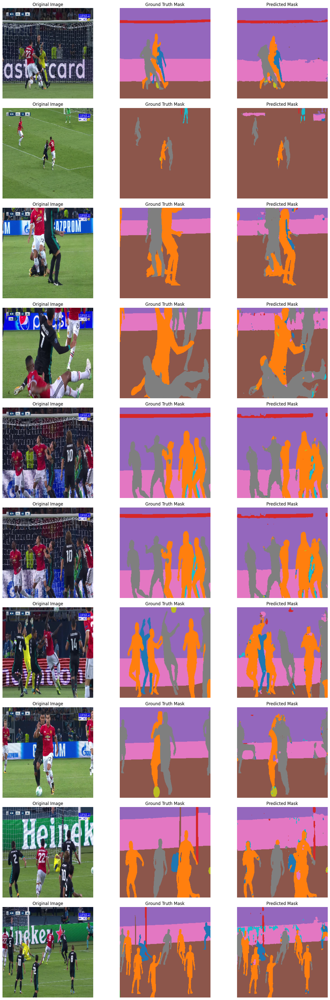

In [ ]:
#24
fixed_colors = list(mcolors.TABLEAU_COLORS.values())
label_colors = {label: fixed_colors[i % len(fixed_colors)] for i, label in enumerate(range(11))}
cmap_fixed = mcolors.ListedColormap([label_colors[label] for label in sorted(label_colors.keys())])


model, _, _ = load_model(model, "Baseline_UNet", optimizer, scheduler)

with torch.no_grad():
    test_iter = iter(test_loader)
    plt.figure(figsize=(15, 40))

    plot_index = 1
    test_loss = 0
    for images, masks in test_iter:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        loss = criterion(outputs, masks)
        test_loss += loss.item()
        pred_masks = torch.argmax(torch.softmax(outputs, dim=1), dim=1).cpu().numpy()

        for b in range(images.size(0)):

            plt.subplot(10, 3, plot_index)
            plt.imshow(images[b].cpu().permute(1, 2, 0))
            plt.title("Original Image")
            plt.axis("off")
            plot_index += 1

            # Ground Truth Mask
            plt.subplot(10, 3, plot_index)
            plt.imshow(masks[b].cpu().numpy(), cmap=cmap_fixed, vmin=0, vmax=10)
            plt.title("Ground Truth Mask")
            plt.axis("off")
            plot_index += 1

            # Predicted Mask
            plt.subplot(10, 3, plot_index)
            plt.imshow(pred_masks[b], cmap=cmap_fixed, vmin=0, vmax=10)
            plt.title("Predicted Mask")
            plt.axis("off")
            plot_index += 1

            if plot_index > 10 * 3:
                break
        if plot_index > 10 * 3:
            break

    avg_test_loss = test_loss / len(test_loader)
    print(f"Test Loss: {avg_test_loss}")

    plt.tight_layout()
    plt.show()

# Transformed data

In [ ]:
#25
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet(num_classes=11).to(device)

num_epochs = 20 #it was 51, changed due to lack of time
criterion = HybridLoss(alpha=0.5, num_classes=11)
optimizer = optim.Adam(model.parameters(), lr=0.005, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, threshold=1e-4, min_lr=1e-6)

train_model(model, "Transformed_UNet", train_transformed_loader, val_transformed_loader, criterion, optimizer, scheduler, num_epochs)

No Checkpoint Found: /content/drive/My Drive/model_storage/Transformed_UNet.pth
Start with Epoch=0, Best Metric=inf


Training 1/20: 100%|██████████| 16/16 [09:02<00:00, 33.88s/it, Loss=0.412]


Epoch [1/20], Loss: 0.4872


Validation 1/20: 100%|██████████| 2/2 [00:18<00:00,  9.01s/it, Loss=0.446]


Validation Loss: 0.4272

Best Validation Metric Updated: inf -> 0.4272
Checkpint Saved: /content/drive/My Drive/model_storage/Transformed_UNet.pth, Epoch: 1, Best Metric: 0.4272


Training 2/20: 100%|██████████| 16/16 [09:04<00:00, 34.06s/it, Loss=0.448]


Epoch [2/20], Loss: 0.3815


Validation 2/20: 100%|██████████| 2/2 [00:18<00:00,  9.45s/it, Loss=0.474]


Validation Loss: 0.4547



Training 3/20:  81%|████████▏ | 13/16 [07:25<01:42, 34.23s/it, Loss=0.373]


KeyboardInterrupt: 

Checkpoint Loaded: /content/drive/My Drive/model_storage/Transformed_UNet.pth, Epoch: 1, Best Metric: 0.4272
Test Loss: 0.5049325704574585


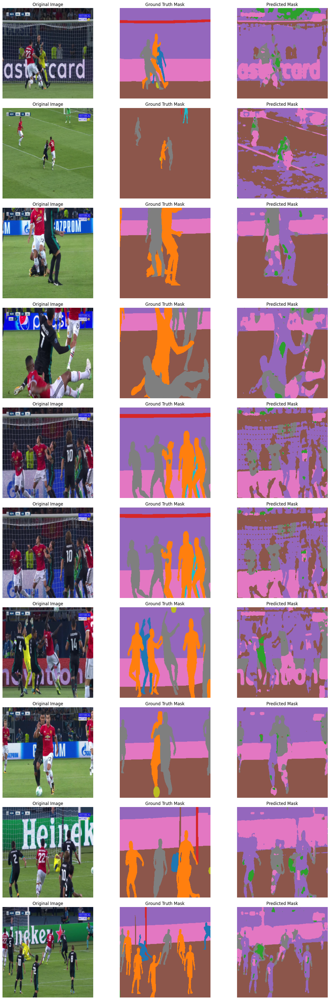

In [ ]:
#26
fixed_colors = list(mcolors.TABLEAU_COLORS.values())
label_colors = {label: fixed_colors[i % len(fixed_colors)] for i, label in enumerate(range(11))}
cmap_fixed = mcolors.ListedColormap([label_colors[label] for label in sorted(label_colors.keys())])

model, _, _ = load_model(model, "Transformed_UNet", optimizer, scheduler)

with torch.no_grad():
    test_transformed_iter = iter(test_transformed_loader)
    plt.figure(figsize=(15, 40))

    plot_index = 1
    test_transformed_loss = 0
    for images, masks in test_transformed_iter:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        loss = criterion(outputs, masks)
        test_transformed_loss += loss.item()


        pred_masks = torch.argmax(torch.softmax(outputs, dim=1), dim=1).cpu().numpy()

        for b in range(images.size(0)):

            plt.subplot(10, 3, plot_index)
            plt.imshow(images[b].cpu().permute(1, 2, 0).numpy())
            plt.title("Original Image")
            plt.axis("off")
            plot_index += 1

            # Ground Truth Mask
            plt.subplot(10, 3, plot_index)
            plt.imshow(masks[b].cpu().numpy(), cmap=cmap_fixed, vmin=0, vmax=10)
            plt.title("Ground Truth Mask")
            plt.axis("off")
            plot_index += 1

            # Predicted Mask
            plt.subplot(10, 3, plot_index)
            plt.imshow(pred_masks[b], cmap=cmap_fixed, vmin=0, vmax=10)
            plt.title("Predicted Mask")
            plt.axis("off")
            plot_index += 1

            if plot_index > 10 * 3:
                break
        if plot_index > 10 * 3:
            break

    avg_test_transformed_loss = test_transformed_loss / len(test_transformed_loader)
    print(f"Test Loss: {avg_test_transformed_loss}")

    plt.tight_layout()
    plt.show()

# Attention Unet

In [ ]:
#27
import torch.nn.functional as Func

# Attention Gate
class AttentionGate(nn.Module):
    def __init__(self, in_channels, gating_channels):
        super(AttentionGate, self).__init__()

        inter_channels = in_channels // 2

        self.W_x = nn.Sequential(
            nn.Conv2d(in_channels, inter_channels, kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(inter_channels)
        )

        self.W_g = nn.Sequential(
            nn.Conv2d(gating_channels, inter_channels, kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(inter_channels)
        )

        self.psi = nn.Sequential(
            nn.Conv2d(inter_channels, 1, kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )

    def forward(self, x, g):

        g = Func.interpolate(g, size=(x.shape[2:]), mode='bilinear', align_corners=True)

        x1 = self.W_x(x)
        g1 = self.W_g(g)

        psi = Func.relu(x1 + g1)
        psi = self.psi(psi)

        return x * psi

class AttentionUNet(nn.Module):
    def __init__(self, num_classes=11):
        super(AttentionUNet, self).__init__()

        def bottleneck_conv_block(in_channels, out_channels):
            return nn.Sequential(

                nn.Conv2d(in_channels, out_channels // 4, kernel_size=1, padding=0),
                nn.BatchNorm2d(out_channels // 4),
                nn.ReLU(inplace=True),

                nn.Conv2d(out_channels // 4, out_channels // 4, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels // 4),
                nn.ReLU(inplace=True),

                nn.Conv2d(out_channels // 4, out_channels, kernel_size=1, padding=0),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),


                nn.Dropout(0.2),


                nn.Conv2d(out_channels, out_channels // 4, kernel_size=1, padding=0),
                nn.BatchNorm2d(out_channels // 4),
                nn.ReLU(inplace=True),

                nn.Conv2d(out_channels // 4, out_channels // 4, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels // 4),
                nn.ReLU(inplace=True),

                nn.Conv2d(out_channels // 4, out_channels, kernel_size=1, padding=0),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
            )


        self.encoder1 = bottleneck_conv_block(3, 64)
        self.encoder2 = bottleneck_conv_block(64, 128)
        self.encoder3 = bottleneck_conv_block(128, 256)
        self.encoder4 = bottleneck_conv_block(256, 512)

        self.pool = nn.MaxPool2d(2, 2)

        self.bottleneck = bottleneck_conv_block(512, 1024)


        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.attn4 = AttentionGate(512, 1024)
        self.decoder4 = bottleneck_conv_block(1024, 512)

        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.attn3 = AttentionGate(256, 512)
        self.decoder3 = bottleneck_conv_block(512, 256)

        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.attn2 = AttentionGate(128, 256)
        self.decoder2 = bottleneck_conv_block(256, 128)

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.attn1 = AttentionGate(64, 128)
        self.decoder1 = bottleneck_conv_block(128, 64)

        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=1)


    def forward(self, x):

        e1 = self.encoder1(x)               # (batch, 64, H, W)
        e2 = self.encoder2(self.pool(e1))   # (batch, 128, H/2, W/2)
        e3 = self.encoder3(self.pool(e2))   # (batch, 256, H/4, W/4)
        e4 = self.encoder4(self.pool(e3))   # (batch, 512, H/8, W/8)


        b = self.bottleneck(self.pool(e4))  # (batch, 1024, H/16, W/16)


        d4 = self.upconv4(b)                # (batch, 512, H/8, W/8)
        e4 = self.attn4(e4, b)              # (batch, 512, H/8, W/8)
        d4 = torch.cat((d4, e4), dim=1)     # (batch, 1024, H/8, W/8)
        d4 = self.decoder4(d4)              # (batch, 512, H/8, W/8)

        d3 = self.upconv3(d4)               # (batch, 256, H/4, W/4)
        e3 = self.attn3(e3, d4)             # (batch, 256, H/4, W/4)
        d3 = torch.cat((d3, e3), dim=1)     # (batch, 512, H/4, W/4)
        d3 = self.decoder3(d3)              # (batch, 256, H/4, W/4)

        d2 = self.upconv2(d3)               # (batch, 128, H/2, W/2)
        e2 = self.attn2(e2, d3)             # (batch, 128, H/2, W/2)
        d2 = torch.cat((d2, e2), dim=1)     # (batch, 256, H/2, W/2)
        d2 = self.decoder2(d2)              # (batch, 128, H/2, W/2)

        d1 = self.upconv1(d2)               # (batch, 64, H, W)
        e1 = self.attn1(e1, d2)             # (batch, 64, H, W)
        d1 = torch.cat((d1, e1), dim=1)     # (batch, 128, H/2, W/2)
        d1 = self.decoder1(d1)              # (batch, 64, H, W)

        return self.final_conv(d1)          # (batch, num_classes, H, W)

In [ ]:
#28
summary(AttentionUNet(num_classes=11), input_size=(8, 3, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
AttentionUNet                            [8, 11, 256, 256]         --
├─Sequential: 1-1                        [8, 64, 256, 256]         --
│    └─Conv2d: 2-1                       [8, 16, 256, 256]         64
│    └─BatchNorm2d: 2-2                  [8, 16, 256, 256]         32
│    └─ReLU: 2-3                         [8, 16, 256, 256]         --
│    └─Conv2d: 2-4                       [8, 16, 256, 256]         2,320
│    └─BatchNorm2d: 2-5                  [8, 16, 256, 256]         32
│    └─ReLU: 2-6                         [8, 16, 256, 256]         --
│    └─Conv2d: 2-7                       [8, 64, 256, 256]         1,088
│    └─BatchNorm2d: 2-8                  [8, 64, 256, 256]         128
│    └─ReLU: 2-9                         [8, 64, 256, 256]         --
│    └─Dropout: 2-10                     [8, 64, 256, 256]         --
│    └─Conv2d: 2-11                      [8, 16, 256, 256]         1,040
│    

In [ ]:
#29
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
attention_model = AttentionUNet(num_classes=11).to(device)

num_epochs = 40
criterion = HybridLoss(alpha=0.5, num_classes=11)
optimizer = optim.Adam(attention_model.parameters(), lr=0.005, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)

train_model(attention_model, "AttentionUNet", train_transformed_loader, val_transformed_loader, criterion, optimizer, scheduler, num_epochs)

No Checkpoint Found: /content/drive/My Drive/model_storage/AttentionUNet.pth
Start with Epoch=0, Best Metric=inf


Training 1/40: 100%|██████████| 16/16 [04:48<00:00, 18.01s/it, Loss=0.511]


Epoch [1/40], Loss: 0.5560


Validation 1/40: 100%|██████████| 2/2 [00:09<00:00,  4.76s/it, Loss=0.563]


Validation Loss: 0.5512

Learning Rate Updated: 0.005000 -> 0.004992
Best Validation Metric Updated: inf -> 0.5512
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 1, Best Metric: 0.5512


Training 2/40: 100%|██████████| 16/16 [04:16<00:00, 16.03s/it, Loss=0.424]


Epoch [2/40], Loss: 0.4506


Validation 2/40: 100%|██████████| 2/2 [00:09<00:00,  4.63s/it, Loss=0.453]


Validation Loss: 0.4350

Learning Rate Updated: 0.004992 -> 0.004969
Best Validation Metric Updated: 0.5512 -> 0.4350
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 2, Best Metric: 0.4350


Training 3/40: 100%|██████████| 16/16 [04:08<00:00, 15.51s/it, Loss=0.4]


Epoch [3/40], Loss: 0.4164


Validation 3/40: 100%|██████████| 2/2 [00:09<00:00,  4.52s/it, Loss=0.456]


Validation Loss: 0.4343

Learning Rate Updated: 0.004969 -> 0.004931
Best Validation Metric Updated: 0.4350 -> 0.4343
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 3, Best Metric: 0.4343


Training 4/40: 100%|██████████| 16/16 [04:13<00:00, 15.83s/it, Loss=0.376]


Epoch [4/40], Loss: 0.3897


Validation 4/40: 100%|██████████| 2/2 [00:09<00:00,  4.85s/it, Loss=0.442]


Validation Loss: 0.4190

Learning Rate Updated: 0.004931 -> 0.004878
Best Validation Metric Updated: 0.4343 -> 0.4190
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 4, Best Metric: 0.4190


Training 5/40: 100%|██████████| 16/16 [04:12<00:00, 15.78s/it, Loss=0.371]


Epoch [5/40], Loss: 0.3821


Validation 5/40: 100%|██████████| 2/2 [00:09<00:00,  4.62s/it, Loss=0.444]


Validation Loss: 0.4255

Learning Rate Updated: 0.004878 -> 0.004810


Training 6/40: 100%|██████████| 16/16 [04:09<00:00, 15.61s/it, Loss=0.446]


Epoch [6/40], Loss: 0.3797


Validation 6/40: 100%|██████████| 2/2 [00:08<00:00,  4.28s/it, Loss=0.416]


Validation Loss: 0.3969

Learning Rate Updated: 0.004810 -> 0.004728
Best Validation Metric Updated: 0.4190 -> 0.3969
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 6, Best Metric: 0.3969


Training 7/40: 100%|██████████| 16/16 [04:08<00:00, 15.56s/it, Loss=0.344]


Epoch [7/40], Loss: 0.3512


Validation 7/40: 100%|██████████| 2/2 [00:08<00:00,  4.45s/it, Loss=0.407]


Validation Loss: 0.3903

Learning Rate Updated: 0.004728 -> 0.004632
Best Validation Metric Updated: 0.3969 -> 0.3903
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 7, Best Metric: 0.3903


Training 8/40: 100%|██████████| 16/16 [04:09<00:00, 15.61s/it, Loss=0.349]


Epoch [8/40], Loss: 0.3529


Validation 8/40: 100%|██████████| 2/2 [00:08<00:00,  4.45s/it, Loss=0.39]


Validation Loss: 0.3768

Learning Rate Updated: 0.004632 -> 0.004523
Best Validation Metric Updated: 0.3903 -> 0.3768
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 8, Best Metric: 0.3768


Training 9/40: 100%|██████████| 16/16 [04:09<00:00, 15.58s/it, Loss=0.359]


Epoch [9/40], Loss: 0.3602


Validation 9/40: 100%|██████████| 2/2 [00:08<00:00,  4.40s/it, Loss=0.383]


Validation Loss: 0.3729

Learning Rate Updated: 0.004523 -> 0.004401
Best Validation Metric Updated: 0.3768 -> 0.3729
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 9, Best Metric: 0.3729


Training 10/40: 100%|██████████| 16/16 [04:02<00:00, 15.18s/it, Loss=0.36]


Epoch [10/40], Loss: 0.3523


Validation 10/40: 100%|██████████| 2/2 [00:09<00:00,  4.51s/it, Loss=0.393]


Validation Loss: 0.3804

Learning Rate Updated: 0.004401 -> 0.004268


Training 11/40: 100%|██████████| 16/16 [04:09<00:00, 15.61s/it, Loss=0.317]


Epoch [11/40], Loss: 0.3377


Validation 11/40: 100%|██████████| 2/2 [00:08<00:00,  4.15s/it, Loss=0.376]


Validation Loss: 0.3660

Learning Rate Updated: 0.004268 -> 0.004124
Best Validation Metric Updated: 0.3729 -> 0.3660
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 11, Best Metric: 0.3660


Training 12/40: 100%|██████████| 16/16 [04:09<00:00, 15.59s/it, Loss=0.344]


Epoch [12/40], Loss: 0.3324


Validation 12/40: 100%|██████████| 2/2 [00:09<00:00,  4.51s/it, Loss=0.39]


Validation Loss: 0.3756

Learning Rate Updated: 0.004124 -> 0.003970


Training 13/40: 100%|██████████| 16/16 [04:14<00:00, 15.94s/it, Loss=0.342]


Epoch [13/40], Loss: 0.3192


Validation 13/40: 100%|██████████| 2/2 [00:09<00:00,  4.85s/it, Loss=0.369]


Validation Loss: 0.3548

Learning Rate Updated: 0.003970 -> 0.003806
Best Validation Metric Updated: 0.3660 -> 0.3548
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 13, Best Metric: 0.3548


Training 14/40: 100%|██████████| 16/16 [04:12<00:00, 15.79s/it, Loss=0.288]


Epoch [14/40], Loss: 0.3247


Validation 14/40: 100%|██████████| 2/2 [00:08<00:00,  4.46s/it, Loss=0.362]


Validation Loss: 0.3473

Learning Rate Updated: 0.003806 -> 0.003635
Best Validation Metric Updated: 0.3548 -> 0.3473
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 14, Best Metric: 0.3473


Training 15/40: 100%|██████████| 16/16 [04:04<00:00, 15.27s/it, Loss=0.31]


Epoch [15/40], Loss: 0.3120


Validation 15/40: 100%|██████████| 2/2 [00:08<00:00,  4.44s/it, Loss=0.361]


Validation Loss: 0.3459

Learning Rate Updated: 0.003635 -> 0.003457
Best Validation Metric Updated: 0.3473 -> 0.3459
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 15, Best Metric: 0.3459


Training 16/40: 100%|██████████| 16/16 [04:04<00:00, 15.31s/it, Loss=0.311]


Epoch [16/40], Loss: 0.2990


Validation 16/40: 100%|██████████| 2/2 [00:09<00:00,  4.83s/it, Loss=0.364]


Validation Loss: 0.3442

Learning Rate Updated: 0.003457 -> 0.003273
Best Validation Metric Updated: 0.3459 -> 0.3442
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 16, Best Metric: 0.3442


Training 17/40: 100%|██████████| 16/16 [04:05<00:00, 15.33s/it, Loss=0.309]


Epoch [17/40], Loss: 0.2979


Validation 17/40: 100%|██████████| 2/2 [00:08<00:00,  4.46s/it, Loss=0.344]


Validation Loss: 0.3345

Learning Rate Updated: 0.003273 -> 0.003084
Best Validation Metric Updated: 0.3442 -> 0.3345
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 17, Best Metric: 0.3345


Training 18/40: 100%|██████████| 16/16 [04:06<00:00, 15.38s/it, Loss=0.265]


Epoch [18/40], Loss: 0.3032


Validation 18/40: 100%|██████████| 2/2 [00:08<00:00,  4.10s/it, Loss=0.348]


Validation Loss: 0.3382

Learning Rate Updated: 0.003084 -> 0.002892


Training 19/40: 100%|██████████| 16/16 [04:06<00:00, 15.42s/it, Loss=0.31]


Epoch [19/40], Loss: 0.2978


Validation 19/40: 100%|██████████| 2/2 [00:08<00:00,  4.25s/it, Loss=0.543]


Validation Loss: 0.4941

Learning Rate Updated: 0.002892 -> 0.002697


Training 20/40: 100%|██████████| 16/16 [04:02<00:00, 15.16s/it, Loss=0.29]


Epoch [20/40], Loss: 0.2865


Validation 20/40: 100%|██████████| 2/2 [00:08<00:00,  4.12s/it, Loss=0.332]


Validation Loss: 0.3175

Learning Rate Updated: 0.002697 -> 0.002501
Best Validation Metric Updated: 0.3345 -> 0.3175
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 20, Best Metric: 0.3175


Training 21/40: 100%|██████████| 16/16 [04:08<00:00, 15.53s/it, Loss=0.294]


Epoch [21/40], Loss: 0.2776


Validation 21/40: 100%|██████████| 2/2 [00:08<00:00,  4.47s/it, Loss=0.345]


Validation Loss: 0.3267

Learning Rate Updated: 0.002501 -> 0.002304


Training 22/40: 100%|██████████| 16/16 [04:06<00:00, 15.40s/it, Loss=0.25]


Epoch [22/40], Loss: 0.2790


Validation 22/40: 100%|██████████| 2/2 [00:08<00:00,  4.24s/it, Loss=0.337]


Validation Loss: 0.3208

Learning Rate Updated: 0.002304 -> 0.002109


Training 23/40: 100%|██████████| 16/16 [04:42<00:00, 17.66s/it, Loss=0.278]


Epoch [23/40], Loss: 0.2675


Validation 23/40: 100%|██████████| 2/2 [00:10<00:00,  5.41s/it, Loss=0.332]


Validation Loss: 0.3148

Learning Rate Updated: 0.002109 -> 0.001917
Best Validation Metric Updated: 0.3175 -> 0.3148
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 23, Best Metric: 0.3148


Training 24/40: 100%|██████████| 16/16 [04:49<00:00, 18.07s/it, Loss=0.236]


Epoch [24/40], Loss: 0.2585


Validation 24/40: 100%|██████████| 2/2 [00:10<00:00,  5.30s/it, Loss=0.341]


Validation Loss: 0.3315

Learning Rate Updated: 0.001917 -> 0.001728


Training 25/40: 100%|██████████| 16/16 [04:41<00:00, 17.57s/it, Loss=0.298]


Epoch [25/40], Loss: 0.2590


Validation 25/40: 100%|██████████| 2/2 [00:10<00:00,  5.06s/it, Loss=0.324]


Validation Loss: 0.3061

Learning Rate Updated: 0.001728 -> 0.001544
Best Validation Metric Updated: 0.3148 -> 0.3061
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 25, Best Metric: 0.3061


Training 26/40: 100%|██████████| 16/16 [04:32<00:00, 17.05s/it, Loss=0.215]


Epoch [26/40], Loss: 0.2551


Validation 26/40: 100%|██████████| 2/2 [00:09<00:00,  4.71s/it, Loss=0.331]


Validation Loss: 0.3067

Learning Rate Updated: 0.001544 -> 0.001366


Training 27/40: 100%|██████████| 16/16 [04:42<00:00, 17.68s/it, Loss=0.269]


Epoch [27/40], Loss: 0.2551


Validation 27/40: 100%|██████████| 2/2 [00:09<00:00,  4.94s/it, Loss=0.338]


Validation Loss: 0.3279

Learning Rate Updated: 0.001366 -> 0.001195


Training 28/40: 100%|██████████| 16/16 [04:12<00:00, 15.80s/it, Loss=0.233]


Epoch [28/40], Loss: 0.2547


Validation 28/40: 100%|██████████| 2/2 [00:08<00:00,  4.44s/it, Loss=0.317]


Validation Loss: 0.3056

Learning Rate Updated: 0.001195 -> 0.001031
Best Validation Metric Updated: 0.3061 -> 0.3056
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 28, Best Metric: 0.3056


Training 29/40: 100%|██████████| 16/16 [04:03<00:00, 15.24s/it, Loss=0.257]


Epoch [29/40], Loss: 0.2510


Validation 29/40: 100%|██████████| 2/2 [00:08<00:00,  4.31s/it, Loss=0.304]


Validation Loss: 0.2864

Learning Rate Updated: 0.001031 -> 0.000877
Best Validation Metric Updated: 0.3056 -> 0.2864
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 29, Best Metric: 0.2864


Training 30/40: 100%|██████████| 16/16 [04:01<00:00, 15.10s/it, Loss=0.277]


Epoch [30/40], Loss: 0.2572


Validation 30/40: 100%|██████████| 2/2 [00:09<00:00,  4.82s/it, Loss=0.306]


Validation Loss: 0.2932

Learning Rate Updated: 0.000877 -> 0.000733


Training 31/40: 100%|██████████| 16/16 [04:07<00:00, 15.45s/it, Loss=0.261]


Epoch [31/40], Loss: 0.2468


Validation 31/40: 100%|██████████| 2/2 [00:09<00:00,  4.53s/it, Loss=0.299]


Validation Loss: 0.2874

Learning Rate Updated: 0.000733 -> 0.000600


Training 32/40: 100%|██████████| 16/16 [04:06<00:00, 15.42s/it, Loss=0.243]


Epoch [32/40], Loss: 0.2450


Validation 32/40: 100%|██████████| 2/2 [00:09<00:00,  4.55s/it, Loss=0.306]


Validation Loss: 0.2862

Learning Rate Updated: 0.000600 -> 0.000478
Best Validation Metric Updated: 0.2864 -> 0.2862
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 32, Best Metric: 0.2862


Training 33/40: 100%|██████████| 16/16 [04:05<00:00, 15.35s/it, Loss=0.219]


Epoch [33/40], Loss: 0.2415


Validation 33/40: 100%|██████████| 2/2 [00:08<00:00,  4.17s/it, Loss=0.297]


Validation Loss: 0.2790

Learning Rate Updated: 0.000478 -> 0.000369
Best Validation Metric Updated: 0.2862 -> 0.2790
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 33, Best Metric: 0.2790


Training 34/40: 100%|██████████| 16/16 [04:00<00:00, 15.05s/it, Loss=0.229]


Epoch [34/40], Loss: 0.2415


Validation 34/40: 100%|██████████| 2/2 [00:09<00:00,  4.54s/it, Loss=0.296]


Validation Loss: 0.2809

Learning Rate Updated: 0.000369 -> 0.000273


Training 35/40: 100%|██████████| 16/16 [03:56<00:00, 14.80s/it, Loss=0.237]


Epoch [35/40], Loss: 0.2391


Validation 35/40: 100%|██████████| 2/2 [00:09<00:00,  4.54s/it, Loss=0.3]


Validation Loss: 0.2821

Learning Rate Updated: 0.000273 -> 0.000191


Training 36/40: 100%|██████████| 16/16 [04:07<00:00, 15.44s/it, Loss=0.211]


Epoch [36/40], Loss: 0.2373


Validation 36/40: 100%|██████████| 2/2 [00:07<00:00,  3.94s/it, Loss=0.294]


Validation Loss: 0.2760

Learning Rate Updated: 0.000191 -> 0.000123
Best Validation Metric Updated: 0.2790 -> 0.2760
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 36, Best Metric: 0.2760


Training 37/40: 100%|██████████| 16/16 [04:17<00:00, 16.09s/it, Loss=0.235]


Epoch [37/40], Loss: 0.2349


Validation 37/40: 100%|██████████| 2/2 [00:09<00:00,  4.85s/it, Loss=0.295]


Validation Loss: 0.2758

Learning Rate Updated: 0.000123 -> 0.000070
Best Validation Metric Updated: 0.2760 -> 0.2758
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 37, Best Metric: 0.2758


Training 38/40: 100%|██████████| 16/16 [04:20<00:00, 16.31s/it, Loss=0.221]


Epoch [38/40], Loss: 0.2375


Validation 38/40: 100%|██████████| 2/2 [00:09<00:00,  4.85s/it, Loss=0.294]


Validation Loss: 0.2750

Learning Rate Updated: 0.000070 -> 0.000032
Best Validation Metric Updated: 0.2758 -> 0.2750
Checkpint Saved: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 38, Best Metric: 0.2750


Training 39/40: 100%|██████████| 16/16 [04:10<00:00, 15.68s/it, Loss=0.269]


Epoch [39/40], Loss: 0.2345


Validation 39/40: 100%|██████████| 2/2 [00:08<00:00,  4.48s/it, Loss=0.296]


Validation Loss: 0.2759

Learning Rate Updated: 0.000032 -> 0.000009


Training 40/40: 100%|██████████| 16/16 [04:06<00:00, 15.43s/it, Loss=0.286]


Epoch [40/40], Loss: 0.2348


Validation 40/40: 100%|██████████| 2/2 [00:08<00:00,  4.14s/it, Loss=0.297]

Validation Loss: 0.2773

Learning Rate Updated: 0.000009 -> 0.000001


Checkpoint Loaded: /content/drive/My Drive/model_storage/AttentionUNet.pth, Epoch: 38, Best Metric: 0.2750
Test Loss: 0.2852956250309944


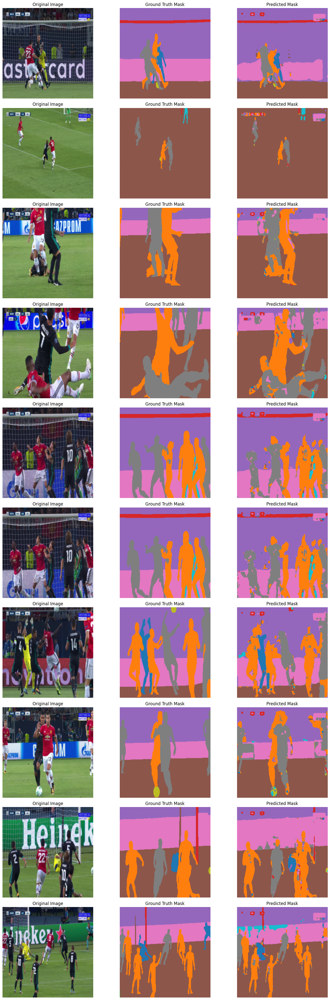

In [ ]:
#30
fixed_colors = list(mcolors.TABLEAU_COLORS.values())
label_colors = {label: fixed_colors[i % len(fixed_colors)] for i, label in enumerate(range(11))}
cmap_fixed = mcolors.ListedColormap([label_colors[label] for label in sorted(label_colors.keys())])


attention_model, _, _ = load_model(attention_model, "AttentionUNet", optimizer, scheduler)

with torch.no_grad():
    test_transformed_iter = iter(test_transformed_loader)
    plt.figure(figsize=(15, 40))

    plot_index = 1
    test_transformed_loss = 0
    for images, masks in test_transformed_iter:
        images, masks = images.to(device), masks.to(device)
        outputs = attention_model(images)
        loss = criterion(outputs, masks)
        test_transformed_loss += loss.item()


        pred_masks = torch.argmax(torch.softmax(outputs, dim=1), dim=1).cpu().numpy()

        for b in range(images.size(0)):

            plt.subplot(10, 3, plot_index)
            plt.imshow(images[b].cpu().permute(1, 2, 0).numpy())
            plt.title("Original Image")
            plt.axis("off")
            plot_index += 1

            # Ground Truth Mask
            plt.subplot(10, 3, plot_index)
            plt.imshow(masks[b].cpu().numpy(), cmap=cmap_fixed, vmin=0, vmax=10)
            plt.title("Ground Truth Mask")
            plt.axis("off")
            plot_index += 1

            # Predicted Mask
            plt.subplot(10, 3, plot_index)
            plt.imshow(pred_masks[b], cmap=cmap_fixed, vmin=0, vmax=10)
            plt.title("Predicted Mask")
            plt.axis("off")
            plot_index += 1

            if plot_index > 10 * 3:
                break
        if plot_index > 10 * 3:
            break

    avg_test_transformed_loss = test_transformed_loss / len(test_transformed_loader)
    print(f"Test Loss: {avg_test_transformed_loss}")

    plt.tight_layout()
    plt.show()

# Another path

In [ ]:
import json, os, torch, cv2, numpy as np, albumentations as A
from PIL import Image; from matplotlib import pyplot as plt
from glob import glob
from torch.utils.data import random_split, Dataset, DataLoader
from albumentations.pytorch import ToTensorV2

In [ ]:
class CustomSegmentationDataset(Dataset):

    def __init__(self, root, transformations = None):

        self.im_paths = sorted(glob(f"{root}/images/*.jpg"))
        self.gt_paths = [im_path for im_path in sorted(glob(f"{root}/images/*.png")) if "fuse" in im_path]
        self.transformations = transformations
        self.n_cls = 11

        assert len(self.im_paths) == len(self.gt_paths)

    def __len__(self): return len(self.im_paths)

    def __getitem__(self, idx):

        im, gt = self.get_im_gt(self.im_paths[idx], self.gt_paths[idx])

        if self.transformations: im, gt = self.apply_transformations(im, gt)

        return im, gt

    def get_im_gt(self, im_path, gt_path): return self.read_im(im_path), self.read_im(gt_path)

    def read_im(self, path): return cv2.cvtColor(cv2.imread(path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)

    def apply_transformations(self, im, gt): transformed = self.transformations(image = im, mask = gt); return transformed["image"], transformed["mask"]

def get_dls(root, transformations, bs, split = [0.9, 0.05, 0.05]):

    assert sum(split) == 1., "Sum of the split must be exactly 1"

    ds = CustomSegmentationDataset(root = root, transformations = transformations)
    n_cls = ds.n_cls

    tr_len = int(len(ds) * split[0])
    val_len = int(len(ds) * split[1])
    test_len = len(ds) - (tr_len + val_len)

    # Data split
    tr_ds, val_ds, test_ds = torch.utils.data.random_split(ds, [tr_len, val_len, test_len])

    print(f"\nThere are {len(tr_ds)} number of images in the train set")
    print(f"There are {len(val_ds)} number of images in the validation set")
    print(f"There are {len(test_ds)} number of images in the test set\n")

    # Get dataloaders
    tr_dl  = DataLoader(dataset = tr_ds, batch_size = bs, shuffle = True, num_workers = 8)
    val_dl = DataLoader(dataset = val_ds, batch_size = bs, shuffle = False, num_workers = 8)
    test_dl = DataLoader(dataset = test_ds, batch_size = 1, shuffle = False, num_workers = 8)

    return tr_dl, val_dl, test_dl, n_cls


mean, std, im_h, im_w = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225], 256, 256
trans = A.Compose( [A.Resize(im_h, im_w), A.augmentations.transforms.Normalize(mean = mean, std = std), ToTensorV2(transpose_mask = True) ])
tr_dl, val_dl, test_dl, n_cls = get_dls(root = path, transformations = trans, bs = 4)


There are 90 number of images in the train set
There are 5 number of images in the validation set
There are 5 number of images in the test set



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


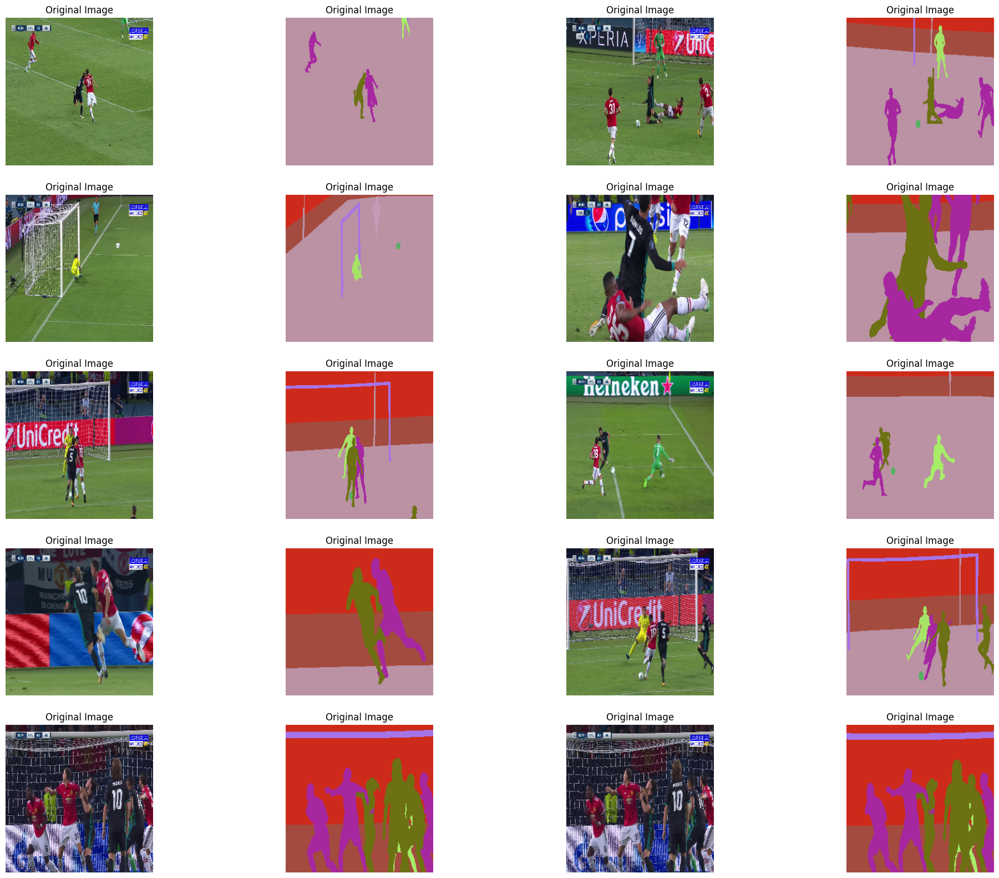

In [ ]:
import random
from torchvision import transforms as tfs

def tn_2_np(t):
    invTrans = tfs.Compose([ tfs.Normalize(mean = [ 0., 0., 0. ], std = [ 1/0.229, 1/0.224, 1/0.225 ]),
                                tfs.Normalize(mean = [ -0.485, -0.456, -0.406 ], std = [ 1., 1., 1. ]) ])

    rgb = True if len(t) == 3 else False

    return (invTrans(t) * 255).detach().cpu().permute(1,2,0).numpy().astype(np.uint8) if rgb else (t*255).detach().cpu().numpy().astype(np.uint8)

def plot(rows, cols, count, im, gt = None, title = "Original Image"):

    plt.subplot(rows, cols, count)
    plt.imshow(tn_2_np(im.squeeze(0).float())) if gt else plt.imshow(tn_2_np(im.squeeze(0)))
    plt.axis("off"); plt.title(title)

    return count + 1

def visualize(ds, n_ims):

    plt.figure(figsize = (25, 20))
    rows = n_ims // 4; cols = n_ims // rows
    count = 1
    indices = [random.randint(0, len(ds) - 1) for _ in range(n_ims)]

    for idx, index in enumerate(indices):

        if count == n_ims + 1: break
        im, gt = ds[index]

        # First Plot
        count = plot(rows, cols, count, im = im)

        # Second Plot
        count = plot(rows, cols, count, im = gt, gt = True)

visualize(tr_dl.dataset, n_ims = 20)

In [ ]:
!pip install segmentation_models_pytorch


  Using cached segmentation_models_pytorch-0.4.0-py3-none-any.whl.metadata (32 kB)
  Using cached efficientnet_pytorch-0.7.1.tar.gz (21 kB)
  Preparing metadata (setup.py) ... done
  Using cached pretrainedmodels-0.7.4.tar.gz (58 kB)
  Preparing metadata (setup.py) ... done
  Using cached munch-4.0.0-py2.py3-none-any.whl.metadata (5.9 kB)
  Using cached nvidia_cuda_nvrtc_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-9.1.0.70-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.4.5.8-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.2.1.3-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.5.147-py3-none-manylinux2014_x86_64.wh

In [ ]:
import segmentation_models_pytorch as smp

In [ ]:
model = smp.DeepLabV3Plus(classes = n_cls)
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = model.parameters(), lr = 3e-4)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 252MB/s]


In [ ]:
import time

In [ ]:
class Metrics():

    def __init__(self, pred, gt, loss_fn, eps = 1e-10, n_cls = 2):

        self.pred, self.gt = torch.argmax(F.softmax(pred, dim=1), dim = 1), gt # (batch, width, height)
        self.loss_fn, self.eps, self.n_cls, self.pred_ = loss_fn, eps, n_cls, pred

    def to_contiguous(self, inp): return inp.contiguous().view(-1)

    def PA(self):

        with torch.no_grad():
            match = torch.eq(self.pred, self.gt).int()

        return float(match.sum()) / float(match.numel())

    def mIoU(self):

        with torch.no_grad():
            self.gt = torch.argmax(self.gt, dim = 1)

            pred, gt = self.to_contiguous(self.pred), self.to_contiguous(self.gt)

            iou_per_class = []

            for c in range(self.n_cls):

                match_pred = pred == c
                match_gt   = gt == c

                if match_gt.long().sum().item() == 0: iou_per_class.append(np.nan)

                else:

                    intersect = torch.logical_and(match_pred, match_gt).sum().float().item()
                    union = torch.logical_or(match_pred, match_gt).sum().float().item()

                    iou = (intersect + self.eps) / (union + self.eps)
                    iou_per_class.append(iou)

            return np.nanmean(iou_per_class)

    def loss(self): return self.loss_fn(self.pred_, torch.argmax(self.gt, dim = 1))

def tic_toc(start_time = None): return time.time() if start_time == None else time.time() - start_time

In [ ]:
from torch.nn import functional as F

In [ ]:
def train(model, tr_dl, val_dl, loss_fn, opt, device, epochs, save_prefix, save_path = "saved_models"):

    tr_loss, tr_pa, tr_iou = [], [], []
    val_loss, val_pa, val_iou = [], [], []
    tr_len, val_len = len(tr_dl), len(val_dl)
    best_loss, decrease, not_improve, early_stop_threshold = np.inf, 1, 0, 10
    os.makedirs(save_path, exist_ok=True)

    model.to(device)
    train_start = tic_toc()
    print("Start training process...")

    for epoch in range(1, epochs + 1):
        tic = tic_toc()
        tr_loss_, tr_iou_, tr_pa_ = 0, 0, 0

        model.train()
        print(f"Epoch {epoch} train process is started...")
        for idx, batch in enumerate(tqdm(tr_dl)):

            ims, gts = batch
            ims, gts = ims.to(device), gts.to(device)

            preds = model(ims)

            met = Metrics(preds, gts, loss_fn, n_cls = n_cls)
            loss_ = met.loss()

            tr_iou_ += met.mIoU()

            tr_pa_ += met.PA()
            tr_loss_ += loss_.item()

            loss_.backward()
            opt.step()
            opt.zero_grad()

        print(f"Epoch {epoch} validation process is started...")
        model.eval()
        val_loss_, val_iou_, val_pa_ = 0, 0, 0

        with torch.no_grad():
            for idx, batch in enumerate(tqdm(val_dl)):

                ims, gts = batch
                ims, gts = ims.to(device), gts.to(device)

                preds = model(ims)

                met = Metrics(preds, gts, loss_fn, n_cls = n_cls)

                val_loss_ += met.loss().item()
                val_iou_ += met.mIoU()
                val_pa_ += met.PA()


        print(f"Epoch {epoch} train process is completed.")

        tr_loss_ /= tr_len
        tr_iou_ /= tr_len
        tr_pa_ /= tr_len

        val_loss_ /= val_len
        val_iou_ /=  val_len
        val_pa_ /=   val_len

        print("\n~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
        print(f"\nEpoch {epoch} train process results: \n")
        print(f"Train Time         -> {tic_toc(tic):.3f} secs")
        print(f"Train Loss         -> {tr_loss_:.3f}")
        print(f"Train PA           -> {tr_pa_:.3f}")
        print(f"Train IoU          -> {tr_iou_:.3f}")
        print(f"Validation Loss    -> {val_loss_:.3f}")
        print(f"Validation PA      -> {val_pa_:.3f}")
        print(f"Validation IoU     -> {val_iou_:.3f}\n")

        tr_loss.append(tr_loss_)
        tr_iou.append(tr_iou_)
        tr_pa.append(tr_pa_)

        val_loss.append(val_loss_)
        val_iou.append(val_iou_)
        val_pa.append(val_pa_)

        if best_loss > (val_loss_):
            print(f"Loss decreased from {best_loss:.3f} to {val_loss_:.3f}!")
            best_loss = val_loss_
            decrease += 1
            if decrease % 2 == 0:
                print("Saving the model with the best loss value...")
                torch.save(model, f"{save_path}/{save_prefix}_best_model.pt")

        if val_loss_ > best_loss:

            not_improve += 1
            best_loss = val_loss_
            print(f"Loss did not decrease for {not_improve} epoch(s)!")
            if not_improve == early_stop_threshold:
                print(f"Stopping training process becuase loss value did not decrease for {early_stop_threshold} epochs!")
                break
        print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~\n")

    print(f"Train process is completed in {(tic_toc(train_start)) / 60:.3f} minutes.")

    return {"tr_loss": tr_loss, "tr_iou": tr_iou, "tr_pa": tr_pa,
            "val_loss": val_loss, "val_iou": val_iou, "val_pa" : val_pa}

device = "cuda" if torch.cuda.is_available() else "cpu"

history = train(model = model, tr_dl = tr_dl, val_dl = val_dl,
                 loss_fn = loss_fn, opt = optimizer, device = device,
                 epochs = 50, save_prefix = "football")

Start training process...
Epoch 1 train process is started...


100%|██████████| 23/23 [01:46<00:00,  4.63s/it]


Epoch 1 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.75s/it]


Epoch 1 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 1 train process results: 

Train Time         -> 110.047 secs
Train Loss         -> 1.309
Train PA           -> 0.729
Train IoU          -> 0.631
Validation Loss    -> 1.364
Validation PA      -> 0.768
Validation IoU     -> 0.585

Loss decreased from inf to 1.364!
Saving the model with the best loss value...
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 2 train process is started...


100%|██████████| 23/23 [01:41<00:00,  4.41s/it]


Epoch 2 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.70s/it]


Epoch 2 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 2 train process results: 

Train Time         -> 104.755 secs
Train Loss         -> 0.527
Train PA           -> 0.887
Train IoU          -> 0.792
Validation Loss    -> 0.514
Validation PA      -> 0.875
Validation IoU     -> 0.771

Loss decreased from 1.364 to 0.514!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 3 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.38s/it]


Epoch 3 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.72s/it]


Epoch 3 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 3 train process results: 

Train Time         -> 104.170 secs
Train Loss         -> 0.332
Train PA           -> 0.915
Train IoU          -> 0.832
Validation Loss    -> 0.331
Validation PA      -> 0.881
Validation IoU     -> 0.776

Loss decreased from 0.514 to 0.331!
Saving the model with the best loss value...
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 4 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.39s/it]


Epoch 4 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.69s/it]


Epoch 4 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 4 train process results: 

Train Time         -> 104.327 secs
Train Loss         -> 0.245
Train PA           -> 0.936
Train IoU          -> 0.874
Validation Loss    -> 0.217
Validation PA      -> 0.927
Validation IoU     -> 0.860

Loss decreased from 0.331 to 0.217!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 5 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.38s/it]


Epoch 5 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.71s/it]


Epoch 5 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 5 train process results: 

Train Time         -> 104.142 secs
Train Loss         -> 0.182
Train PA           -> 0.949
Train IoU          -> 0.900
Validation Loss    -> 0.179
Validation PA      -> 0.941
Validation IoU     -> 0.886

Loss decreased from 0.217 to 0.179!
Saving the model with the best loss value...
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 6 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.38s/it]


Epoch 6 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.72s/it]


Epoch 6 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 6 train process results: 

Train Time         -> 104.272 secs
Train Loss         -> 0.147
Train PA           -> 0.957
Train IoU          -> 0.915
Validation Loss    -> 0.152
Validation PA      -> 0.947
Validation IoU     -> 0.896

Loss decreased from 0.179 to 0.152!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 7 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.38s/it]


Epoch 7 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.73s/it]


Epoch 7 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 7 train process results: 

Train Time         -> 104.164 secs
Train Loss         -> 0.149
Train PA           -> 0.958
Train IoU          -> 0.910
Validation Loss    -> 0.161
Validation PA      -> 0.942
Validation IoU     -> 0.886

Loss did not decrease for 1 epoch(s)!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 8 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.38s/it]


Epoch 8 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.71s/it]


Epoch 8 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 8 train process results: 

Train Time         -> 104.080 secs
Train Loss         -> 0.146
Train PA           -> 0.959
Train IoU          -> 0.916
Validation Loss    -> 0.167
Validation PA      -> 0.942
Validation IoU     -> 0.886

Loss did not decrease for 2 epoch(s)!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 9 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.39s/it]


Epoch 9 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.73s/it]


Epoch 9 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 9 train process results: 

Train Time         -> 104.457 secs
Train Loss         -> 0.119
Train PA           -> 0.962
Train IoU          -> 0.922
Validation Loss    -> 0.124
Validation PA      -> 0.953
Validation IoU     -> 0.908

Loss decreased from 0.167 to 0.124!
Saving the model with the best loss value...
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 10 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.38s/it]


Epoch 10 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.68s/it]


Epoch 10 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 10 train process results: 

Train Time         -> 104.020 secs
Train Loss         -> 0.113
Train PA           -> 0.964
Train IoU          -> 0.926
Validation Loss    -> 0.111
Validation PA      -> 0.959
Validation IoU     -> 0.919

Loss decreased from 0.124 to 0.111!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 11 train process is started...


100%|██████████| 23/23 [01:39<00:00,  4.34s/it]


Epoch 11 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.73s/it]


Epoch 11 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 11 train process results: 

Train Time         -> 103.379 secs
Train Loss         -> 0.123
Train PA           -> 0.963
Train IoU          -> 0.926
Validation Loss    -> 0.104
Validation PA      -> 0.961
Validation IoU     -> 0.923

Loss decreased from 0.111 to 0.104!
Saving the model with the best loss value...
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 12 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.35s/it]


Epoch 12 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.71s/it]


Epoch 12 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 12 train process results: 

Train Time         -> 103.463 secs
Train Loss         -> 0.093
Train PA           -> 0.969
Train IoU          -> 0.938
Validation Loss    -> 0.115
Validation PA      -> 0.956
Validation IoU     -> 0.913

Loss did not decrease for 3 epoch(s)!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 13 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.38s/it]


Epoch 13 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.71s/it]


Epoch 13 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 13 train process results: 

Train Time         -> 104.241 secs
Train Loss         -> 0.087
Train PA           -> 0.971
Train IoU          -> 0.941
Validation Loss    -> 0.098
Validation PA      -> 0.964
Validation IoU     -> 0.928

Loss decreased from 0.115 to 0.098!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 14 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.35s/it]


Epoch 14 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.72s/it]


Epoch 14 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 14 train process results: 

Train Time         -> 103.531 secs
Train Loss         -> 0.073
Train PA           -> 0.975
Train IoU          -> 0.949
Validation Loss    -> 0.087
Validation PA      -> 0.966
Validation IoU     -> 0.933

Loss decreased from 0.098 to 0.087!
Saving the model with the best loss value...
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 15 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.36s/it]


Epoch 15 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.72s/it]


Epoch 15 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 15 train process results: 

Train Time         -> 103.815 secs
Train Loss         -> 0.077
Train PA           -> 0.975
Train IoU          -> 0.948
Validation Loss    -> 0.082
Validation PA      -> 0.969
Validation IoU     -> 0.937

Loss decreased from 0.087 to 0.082!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 16 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.36s/it]


Epoch 16 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.69s/it]


Epoch 16 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 16 train process results: 

Train Time         -> 103.690 secs
Train Loss         -> 0.070
Train PA           -> 0.977
Train IoU          -> 0.951
Validation Loss    -> 0.086
Validation PA      -> 0.967
Validation IoU     -> 0.933

Loss did not decrease for 4 epoch(s)!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 17 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.36s/it]


Epoch 17 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.91s/it]


Epoch 17 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 17 train process results: 

Train Time         -> 104.224 secs
Train Loss         -> 0.069
Train PA           -> 0.977
Train IoU          -> 0.952
Validation Loss    -> 0.077
Validation PA      -> 0.970
Validation IoU     -> 0.940

Loss decreased from 0.086 to 0.077!
Saving the model with the best loss value...
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 18 train process is started...


100%|██████████| 23/23 [01:44<00:00,  4.52s/it]


Epoch 18 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.74s/it]


Epoch 18 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 18 train process results: 

Train Time         -> 107.505 secs
Train Loss         -> 0.057
Train PA           -> 0.979
Train IoU          -> 0.958
Validation Loss    -> 0.077
Validation PA      -> 0.970
Validation IoU     -> 0.939

Loss did not decrease for 5 epoch(s)!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 19 train process is started...


100%|██████████| 23/23 [01:44<00:00,  4.53s/it]


Epoch 19 validation process is started...


100%|██████████| 2/2 [00:03<00:00,  1.87s/it]


Epoch 19 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 19 train process results: 

Train Time         -> 107.967 secs
Train Loss         -> 0.062
Train PA           -> 0.979
Train IoU          -> 0.956
Validation Loss    -> 0.074
Validation PA      -> 0.972
Validation IoU     -> 0.943

Loss decreased from 0.077 to 0.074!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 20 train process is started...


100%|██████████| 23/23 [01:41<00:00,  4.43s/it]


Epoch 20 validation process is started...


100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


Epoch 20 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 20 train process results: 

Train Time         -> 106.266 secs
Train Loss         -> 0.063
Train PA           -> 0.980
Train IoU          -> 0.956
Validation Loss    -> 0.072
Validation PA      -> 0.972
Validation IoU     -> 0.944

Loss decreased from 0.074 to 0.072!
Saving the model with the best loss value...
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 21 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.38s/it]


Epoch 21 validation process is started...


100%|██████████| 2/2 [00:04<00:00,  2.21s/it]


Epoch 21 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 21 train process results: 

Train Time         -> 105.202 secs
Train Loss         -> 0.057
Train PA           -> 0.981
Train IoU          -> 0.959
Validation Loss    -> 0.070
Validation PA      -> 0.972
Validation IoU     -> 0.943

Loss decreased from 0.072 to 0.070!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 22 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.36s/it]


Epoch 22 validation process is started...


100%|██████████| 2/2 [00:04<00:00,  2.18s/it]


Epoch 22 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 22 train process results: 

Train Time         -> 104.603 secs
Train Loss         -> 0.053
Train PA           -> 0.981
Train IoU          -> 0.960
Validation Loss    -> 0.072
Validation PA      -> 0.971
Validation IoU     -> 0.942

Loss did not decrease for 6 epoch(s)!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 23 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.35s/it]


Epoch 23 validation process is started...


100%|██████████| 2/2 [00:04<00:00,  2.31s/it]


Epoch 23 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 23 train process results: 

Train Time         -> 104.651 secs
Train Loss         -> 0.055
Train PA           -> 0.980
Train IoU          -> 0.959
Validation Loss    -> 0.071
Validation PA      -> 0.972
Validation IoU     -> 0.944

Loss decreased from 0.072 to 0.071!
Saving the model with the best loss value...
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 24 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.36s/it]


Epoch 24 validation process is started...


100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


Epoch 24 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 24 train process results: 

Train Time         -> 105.147 secs
Train Loss         -> 0.052
Train PA           -> 0.981
Train IoU          -> 0.961
Validation Loss    -> 0.078
Validation PA      -> 0.969
Validation IoU     -> 0.937

Loss did not decrease for 7 epoch(s)!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 25 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.35s/it]


Epoch 25 validation process is started...


100%|██████████| 2/2 [00:04<00:00,  2.12s/it]


Epoch 25 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 25 train process results: 

Train Time         -> 104.368 secs
Train Loss         -> 0.052
Train PA           -> 0.982
Train IoU          -> 0.960
Validation Loss    -> 0.074
Validation PA      -> 0.970
Validation IoU     -> 0.940

Loss decreased from 0.078 to 0.074!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 26 train process is started...


100%|██████████| 23/23 [01:39<00:00,  4.34s/it]


Epoch 26 validation process is started...


100%|██████████| 2/2 [00:04<00:00,  2.01s/it]


Epoch 26 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 26 train process results: 

Train Time         -> 103.915 secs
Train Loss         -> 0.050
Train PA           -> 0.982
Train IoU          -> 0.962
Validation Loss    -> 0.065
Validation PA      -> 0.974
Validation IoU     -> 0.947

Loss decreased from 0.074 to 0.065!
Saving the model with the best loss value...
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 27 train process is started...


100%|██████████| 23/23 [01:39<00:00,  4.34s/it]


Epoch 27 validation process is started...


100%|██████████| 2/2 [00:04<00:00,  2.11s/it]


Epoch 27 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 27 train process results: 

Train Time         -> 104.048 secs
Train Loss         -> 0.047
Train PA           -> 0.983
Train IoU          -> 0.965
Validation Loss    -> 0.063
Validation PA      -> 0.974
Validation IoU     -> 0.947

Loss decreased from 0.065 to 0.063!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 28 train process is started...


100%|██████████| 23/23 [01:41<00:00,  4.41s/it]


Epoch 28 validation process is started...


100%|██████████| 2/2 [00:04<00:00,  2.22s/it]


Epoch 28 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 28 train process results: 

Train Time         -> 105.800 secs
Train Loss         -> 0.044
Train PA           -> 0.984
Train IoU          -> 0.966
Validation Loss    -> 0.061
Validation PA      -> 0.975
Validation IoU     -> 0.949

Loss decreased from 0.063 to 0.061!
Saving the model with the best loss value...
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 29 train process is started...


100%|██████████| 23/23 [01:42<00:00,  4.44s/it]


Epoch 29 validation process is started...


100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


Epoch 29 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 29 train process results: 

Train Time         -> 106.876 secs
Train Loss         -> 0.044
Train PA           -> 0.984
Train IoU          -> 0.966
Validation Loss    -> 0.061
Validation PA      -> 0.975
Validation IoU     -> 0.949

Loss decreased from 0.061 to 0.061!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 30 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.35s/it]


Epoch 30 validation process is started...


100%|██████████| 2/2 [00:04<00:00,  2.25s/it]


Epoch 30 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 30 train process results: 

Train Time         -> 104.598 secs
Train Loss         -> 0.042
Train PA           -> 0.985
Train IoU          -> 0.967
Validation Loss    -> 0.063
Validation PA      -> 0.975
Validation IoU     -> 0.949

Loss did not decrease for 8 epoch(s)!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 31 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.35s/it]


Epoch 31 validation process is started...


100%|██████████| 2/2 [00:04<00:00,  2.22s/it]


Epoch 31 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 31 train process results: 

Train Time         -> 104.600 secs
Train Loss         -> 0.042
Train PA           -> 0.984
Train IoU          -> 0.967
Validation Loss    -> 0.060
Validation PA      -> 0.975
Validation IoU     -> 0.949

Loss decreased from 0.063 to 0.060!
Saving the model with the best loss value...
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 32 train process is started...


100%|██████████| 23/23 [01:40<00:00,  4.38s/it]


Epoch 32 validation process is started...


100%|██████████| 2/2 [00:04<00:00,  2.05s/it]


Epoch 32 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 32 train process results: 

Train Time         -> 104.848 secs
Train Loss         -> 0.040
Train PA           -> 0.985
Train IoU          -> 0.969
Validation Loss    -> 0.064
Validation PA      -> 0.974
Validation IoU     -> 0.948

Loss did not decrease for 9 epoch(s)!
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 33 train process is started...


100%|██████████| 23/23 [01:41<00:00,  4.40s/it]


Epoch 33 validation process is started...


100%|██████████| 2/2 [00:04<00:00,  2.01s/it]

Epoch 33 train process is completed.

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Epoch 33 train process results: 

Train Time         -> 105.333 secs
Train Loss         -> 0.054
Train PA           -> 0.981
Train IoU          -> 0.962
Validation Loss    -> 0.085
Validation PA      -> 0.969
Validation IoU     -> 0.937

Loss did not decrease for 10 epoch(s)!
Stopping training process becuase loss value did not decrease for 10 epochs!
Train process is completed in 57.736 minutes.
